##### Importing libraries:

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
from datetime import *

from sklearn import tree
import graphviz

#from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
#from IPython.display import Image  
#import pydotplus

from category_encoders import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score 
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from pprint import pprint

from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

##### Import the original dataset into df0:

In [2]:
pd.set_option('display.max_columns', 40)

path_file = r'C:\Users\ricar\Python_Algorithms\ifood-data-business-analyst-test-master'
file_name = r'ml_project1_data.csv'
path_file_name = os.path.join(path_file, file_name)

df0 = pd.read_csv(path_file_name)
df0

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


In [3]:
df0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

##### Copy the df0 into df and drop columns 'ID', 'Z_CostContact' and 'Z_Revenue':

Why do you drop 'Z_CostContact' and 'Z_Revenue'?

Because they are only constants and they aren't on metadata table.


Why do you drop 'ID'?

Because ID not important to describe a cluster.

In [4]:
df = df0.copy()
df = df.drop(['ID', 'Z_CostContact', 'Z_Revenue'], axis = 1)
df

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2236,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2237,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2238,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2240 non-null   int64  
 1   Education            2240 non-null   object 
 2   Marital_Status       2240 non-null   object 
 3   Income               2216 non-null   float64
 4   Kidhome              2240 non-null   int64  
 5   Teenhome             2240 non-null   int64  
 6   Dt_Customer          2240 non-null   object 
 7   Recency              2240 non-null   int64  
 8   MntWines             2240 non-null   int64  
 9   MntFruits            2240 non-null   int64  
 10  MntMeatProducts      2240 non-null   int64  
 11  MntFishProducts      2240 non-null   int64  
 12  MntSweetProducts     2240 non-null   int64  
 13  MntGoldProds         2240 non-null   int64  
 14  NumDealsPurchases    2240 non-null   int64  
 15  NumWebPurchases      2240 non-null   i

# Feature engineering:

##### Looking for missing:

In [6]:
df.isnull().sum()

Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
dtype: int64

There are twenty four missing values on the feature Income.

Finding where 'Income' is missing:

In [7]:
df_income = df0.copy()

index_ = df_income[ df_income['Income'].isnull()].index

df_income = pd.DataFrame(df_income, index=index_)
df_income

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
10,1994,1983,Graduation,Married,NaN,1,0,2013-11-15,11,5,5,6,0,2,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
27,5255,1986,Graduation,Single,NaN,1,0,2013-02-20,19,5,1,3,3,263,362,0,27,0,0,1,0,0,0,0,0,0,3,11,0
43,7281,1959,PhD,Single,NaN,0,0,2013-11-05,80,81,11,50,3,2,39,1,1,3,4,2,0,0,0,0,0,0,3,11,0
48,7244,1951,Graduation,Single,NaN,2,1,2014-01-01,96,48,5,48,6,10,7,3,2,1,4,6,0,0,0,0,0,0,3,11,0
58,8557,1982,Graduation,Single,NaN,1,0,2013-06-17,57,11,3,22,2,2,6,2,2,0,3,6,0,0,0,0,0,0,3,11,0
71,10629,1973,2n Cycle,Married,NaN,1,0,2012-09-14,25,25,3,43,17,4,17,3,3,0,3,8,0,0,0,0,0,0,3,11,0
90,8996,1957,PhD,Married,NaN,2,1,2012-11-19,4,230,42,192,49,37,53,12,7,2,8,9,0,0,0,0,0,0,3,11,0
91,9235,1957,Graduation,Single,NaN,1,1,2014-05-27,45,7,0,8,2,0,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
92,5798,1973,Master,Together,NaN,0,0,2013-11-23,87,445,37,359,98,28,18,1,2,4,8,1,0,0,0,0,0,0,3,11,0
128,8268,1961,PhD,Married,NaN,0,1,2013-07-11,23,352,0,27,10,0,15,3,6,1,7,6,0,0,0,0,0,0,3,11,0


Now, let's fill it up with median:

In [8]:
df['Income'].fillna(df['Income'].median(), inplace = True)

There are no missing values at 'Income':

In [9]:
df.isnull().sum()

Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Response               0
dtype: int64

In [10]:
df['Income'].describe().T

count      2240.000000
mean      52237.975446
std       25037.955891
min        1730.000000
25%       35538.750000
50%       51381.500000
75%       68289.750000
max      666666.000000
Name: Income, dtype: float64

Above, you see maximum value for 'Income' is 666.666.

##### Plotting Histogram and Boxplot for 'Income':

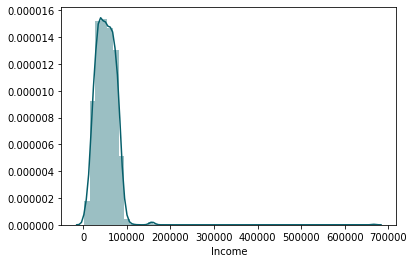

In [11]:
sns.distplot(df['Income'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['Income'], name='Income', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Income', width=500, height=500)
fig.show()

Look at boxplot, Income = 666.666 looks like an outlier.

Creating a new object called 'test_income' let's check dropping Income = 666.666:

In [12]:
test_income = df[df['Income']<666666]

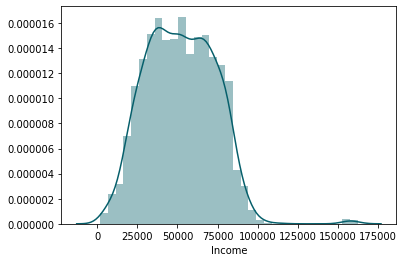

In [13]:
sns.distplot(test_income['Income'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=test_income['Income'], name='Income', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Income', width=500, height=500)
fig.show()

In [14]:
df[df['Income']>=666666]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2233,1977,Graduation,Together,666666.0,1,0,2013-06-02,23,9,14,18,8,1,12,4,3,1,3,6,0,0,0,0,0,0,0


There is only one Income bigger than 666.666. This customer don't spend a lot of money and it didn't accept any campaign so let's drop it as an outlier:

In [15]:
df.drop(df[df['Income']>=666666].index , inplace=True)

Doing another validation but now if Income < 140000

In [16]:
test_income = df[df['Income']<140000]

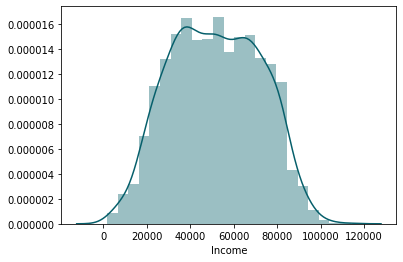

In [17]:
sns.distplot(test_income['Income'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=test_income['Income'], name='', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Income', width=500, height=500)
fig.show()

Look at histogram and boxplot above. It looks like better without 'Income'>=140000 but let's do some analysis about that:

In [18]:
df[df['Income']>=140000]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
164,1973,PhD,Married,157243.0,0,1,2014-03-01,98,20,2,1582,1,2,1,15,0,22,0,0,0,0,0,0,0,0,0
617,1976,PhD,Together,162397.0,1,1,2013-06-03,31,85,1,16,2,1,2,0,0,0,1,1,0,0,0,0,0,0,0
655,1975,Graduation,Divorced,153924.0,0,0,2014-02-07,81,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
687,1982,PhD,Married,160803.0,0,0,2012-08-04,21,55,16,1622,17,3,4,15,0,28,1,0,0,0,0,0,0,0,0
1300,1971,Master,Together,157733.0,1,0,2013-06-04,37,39,1,9,2,0,8,0,1,0,1,1,0,0,0,0,0,0,0
1653,1977,Graduation,Together,157146.0,0,0,2013-04-29,13,1,0,1725,2,1,1,0,0,28,0,1,0,0,0,0,0,0,0
2132,1949,PhD,Married,156924.0,0,0,2013-08-29,85,2,1,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0


There are seven customers with Income> = 140,000 but didn't accept any campaing.

There are three customers spend more than 1500 with Meat Products and two of those customers have recency <40 days.

There are four customers don't spend a lot of money in any kind of prouucts.

I won't drop those seven customers now.

##### Descriptive statistics:

In [19]:
list_columns = df.drop(['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5','Response'], axis=1).columns
df[list_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
Year_Birth,2239.0,1968.802144,11.985494,1893.0,1959.0,1970.0,1977.0,1996.0
Income,2239.0,51963.554712,21410.672116,1730.0,35533.5,51381.5,68277.5,162397.0
Kidhome,2239.0,0.443948,0.538390,0.0,0.0,0.0,1.0,2.0
Teenhome,2239.0,0.506476,0.544555,0.0,0.0,0.0,1.0,2.0
Recency,2239.0,49.121036,28.963662,0.0,24.0,49.0,74.0,99.0
MntWines,2239.0,304.067441,336.614830,0.0,24.0,174.0,504.5,1493.0
MntFruits,2239.0,26.307727,39.781468,0.0,1.0,8.0,33.0,199.0
MntMeatProducts,2239.0,167.016525,225.743829,0.0,16.0,67.0,232.0,1725.0
MntFishProducts,2239.0,37.538633,54.637617,0.0,3.0,12.0,50.0,259.0
MntSweetProducts,2239.0,27.074587,41.286043,0.0,1.0,8.0,33.0,263.0


Plotting Histogram and Boxplot for 'Income' only for customers that accepted the 6th Campaign (Response = 1):

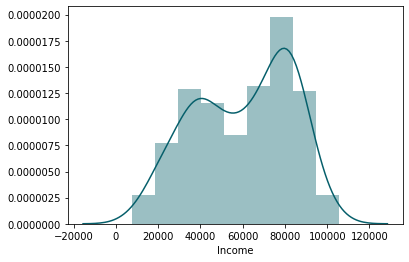

In [20]:
sns.distplot(df[df['Response']==1]['Income'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==1]['Income'], name='Income', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Income', width=500, height=500)
fig.show()

Plotting Histogram and Boxplot for 'Income' from two clusters (accepted and didn't accept the 6th campaign):

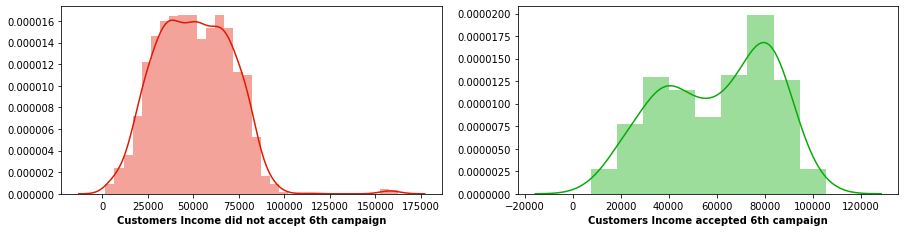

In [21]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['Income'],kde=True, color = '#E11901')
plt.xlabel('Customers Income did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['Income'],kde=True, color = '#08AA09')
plt.xlabel('Customers Income accepted 6th campaign', fontweight="bold")

plt.show()

In [22]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['Income'], x=df[df['Response']==0]['Response'], name='Did not accept 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['Income'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Income', height=500)
fig.show()

Descriptive statistics for Income of customers accepted the 6th campaign:

In [23]:
df[df['Response']==1]['Income'].describe()

count       334.000000
mean      60183.244012
std       23164.266112
min        7500.000000
25%       39786.750000
50%       64044.000000
75%       80477.000000
max      105471.000000
Name: Income, dtype: float64

Descriptive statistics for Income of customers didn't accept the 6th campaign:

In [24]:
df[df['Response']==0]['Income'].describe()

count      1905.000000
mean      50522.412336
std       20761.907425
min        1730.000000
25%       34554.000000
50%       50523.000000
75%       65846.000000
max      162397.000000
Name: Income, dtype: float64

Income median of customers accepted the 6th campaign is greater than Income median of customers didn't accept it.

Income standard deviation of customers accepted the 6th campaign is greater than Income standard deviation of customers didn't accept it.

There are some Income outliers of customers did not accept the 6th campaign.

In [25]:
upper_fence = df[df['Response']==0]['Income'].quantile(0.75) + (1.5 * (df[df['Response']==0]['Income'].quantile(0.75)-df[df['Response']==0]['Income'].quantile(0.25)))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['Income'] > upper_fence)]['Income'].count(), 'Income outliers of customers did not accept the 6th campaign.')

Upper Fence = 112784.0
There are 8 Income outliers of customers did not accept the 6th campaign.


Let's find those outliers and replece them by median.

In [26]:
df[(df['Response']==0) & (df['Income']>upper_fence)]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
164,1973,PhD,Married,157243.0,0,1,2014-03-01,98,20,2,1582,1,2,1,15,0,22,0,0,0,0,0,0,0,0,0
617,1976,PhD,Together,162397.0,1,1,2013-06-03,31,85,1,16,2,1,2,0,0,0,1,1,0,0,0,0,0,0,0
655,1975,Graduation,Divorced,153924.0,0,0,2014-02-07,81,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
687,1982,PhD,Married,160803.0,0,0,2012-08-04,21,55,16,1622,17,3,4,15,0,28,1,0,0,0,0,0,0,0,0
1300,1971,Master,Together,157733.0,1,0,2013-06-04,37,39,1,9,2,0,8,0,1,0,1,1,0,0,0,0,0,0,0
1653,1977,Graduation,Together,157146.0,0,0,2013-04-29,13,1,0,1725,2,1,1,0,0,28,0,1,0,0,0,0,0,0,0
1898,1945,PhD,Single,113734.0,0,0,2014-05-28,9,6,2,3,1,262,3,0,27,0,0,1,0,0,0,0,0,0,0
2132,1949,PhD,Married,156924.0,0,0,2013-08-29,85,2,1,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0


Replacing Income outliers of customers did not accept the 6th campaign by the median: 

In [27]:
df['Income'] = np.where((df['Response']==0) & (df['Income']>upper_fence), df[df['Response']==0]['Income'].median(), df['Income'])

In [28]:
print('Now, there are', df[(df['Response']==0) & (df['Income']>upper_fence)]['Income'].count(), 'Income outliers of customers did not accept the 6th campaign.')

Now, there are 0 Income outliers of customers did not accept the 6th campaign.


Look at the new boxplot:

In [29]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['Income'], x=df[df['Response']==0]['Response'], name='Did not accept 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['Income'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Income')
fig.show()

##### Analysing Year_Birth:

In [30]:
df['Year_Birth'].groupby(df['Year_Birth']).count()

Year_Birth
1893     1
1899     1
1900     1
1940     1
1941     1
1943     7
1944     7
1945     8
1946    16
1947    16
1948    21
1949    30
1950    29
1951    43
1952    52
1953    35
1954    50
1955    49
1956    55
1957    43
1958    53
1959    51
1960    49
1961    36
1962    44
1963    45
1964    42
1965    74
1966    50
1967    44
1968    51
1969    71
1970    77
1971    87
1972    79
1973    74
1974    69
1975    83
1976    89
1977    51
1978    77
1979    53
1980    39
1981    39
1982    45
1983    42
1984    38
1985    32
1986    42
1987    27
1988    29
1989    30
1990    18
1991    15
1992    13
1993     5
1994     3
1995     5
1996     2
Name: Year_Birth, dtype: int64

Checking the feature 'Year_Birth' there are three customers were born before 1900. 

Let's replace those three rows by median from Year_Birth.

In [31]:
index_Year_Birth = df[df['Year_Birth'] <= 1900].index
df.loc[index_Year_Birth,'Year_Birth'] = df['Year_Birth'].median()

Let's create a new column called 'Age' and drop after that I will drop the feature 'Year_Birth':

In [32]:
df['Age'] = pd.datetime.today().year - df['Year_Birth']
df = df.drop(['Year_Birth'], axis=1)
df

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age
0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,63.0
1,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,66.0
2,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,55.0
3,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,36.0
4,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,39.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,53.0
2236,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,74.0
2237,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,39.0
2238,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,64.0


##### Plotting Histogram and Boxplot for 'Age':

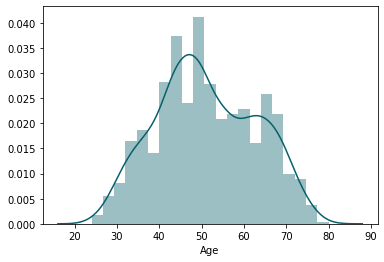

In [33]:
sns.distplot(df['Age'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['Age'], name='Age', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Age', width=500, height=500)
fig.show()

Plotting Histogram and Boxplot for 'Age' from two clusters (accepted and didn't accept 6th campaign):

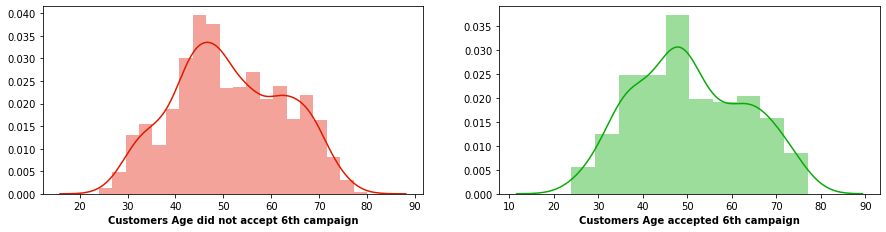

In [34]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['Age'],kde=True, color = '#E11901')
plt.xlabel('Customers Age did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['Age'],kde=True, color = '#08AA09')
plt.xlabel('Customers Age accepted 6th campaign', fontweight="bold")

plt.show()

In [35]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['Age'], x=df[df['Response']==0]['Response'], name='Did not accept 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['Age'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Age', height=500)
fig.show()

Age of customers accepted the 6th campaign:

In [36]:
df[df['Response']==1]['Age'].describe()

count    334.000000
mean      50.583832
std       12.398192
min       24.000000
25%       41.000000
50%       49.000000
75%       61.000000
max       77.000000
Name: Age, dtype: float64

Age of customers didn't accept the 6th campaign:

In [37]:
df[df['Response']==0]['Age'].describe()

count    1905.000000
mean       51.191076
std        11.568949
min        24.000000
25%        43.000000
50%        50.000000
75%        61.000000
max        80.000000
Name: Age, dtype: float64

Age median of customers accepted the 6th campaign is lower than Age median of customers didn't accept it.

Age standard deviation of customers accepted the 6th campaign is greater than Age standard deviation of customers didn't accept it.

Both histograms look like Gaussian Distribution and there aren't outliers.

##### Analysing 'Dt_Customer':

Let's validate year, month and day from Dt_Customer:

In [38]:
check_dt_customer = pd.DataFrame(columns=['Year_SignUp', 'Month_SignUp', 'Day_SignUp'])
check_dt_customer['Year_SignUp'] = pd.to_datetime(df['Dt_Customer']).dt.year
check_dt_customer['Month_SignUp'] = pd.to_datetime(df['Dt_Customer']).dt.month
check_dt_customer['Day_SignUp'] = pd.to_datetime(df['Dt_Customer']).dt.day
check_dt_customer

,Year_SignUp,Month_SignUp,Day_SignUp
0,2012,9,4
1,2014,3,8
2,2013,8,21
3,2014,2,10
4,2014,1,19
...,...,...,...
2235,2013,6,13
2236,2014,6,10
2237,2014,1,25
2238,2014,1,24


In [39]:
check_dt_customer['Year_SignUp'].groupby(check_dt_customer['Year_SignUp']).count()

Year_SignUp
2012     494
2013    1188
2014     557
Name: Year_SignUp, dtype: int64

In [40]:
check_dt_customer['Month_SignUp'].groupby(check_dt_customer['Month_SignUp']).count()

Month_SignUp
1     197
2     178
3     211
4     182
5     216
6     165
7     101
8     222
9     193
10    212
11    187
12    175
Name: Month_SignUp, dtype: int64

In [41]:
check_dt_customer['Day_SignUp'].groupby(check_dt_customer['Day_SignUp']).count()

Day_SignUp
1      74
2      77
3      75
4      71
5      75
6      65
7      83
8      71
9      59
10     79
11     83
12    103
13     69
14     58
15     60
16     71
17     91
18     78
19     69
20     73
21     62
22     89
23     89
24     60
25     73
26     61
27     56
28     74
29     82
30     59
31     50
Name: Day_SignUp, dtype: int64

Above, year, month and day from 'Dt_Customer' make sense.

Let's create a new column called 'Member_Months' (it's the age in  months since the customer has joined) and after that I will drop the feature 'Dt_Customer':

In [42]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
df['Today'] = pd.to_datetime(date.today())
df['Member_Months'] = round(((df['Today'] - df['Dt_Customer']).astype('timedelta64[D]'))/30).astype('int64')
df = df.drop(['Dt_Customer', 'Today'], axis = 1)
df

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
0,Graduation,Single,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,63.0,98
1,Graduation,Single,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,66.0,80
2,Graduation,Together,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,55.0,86
3,Graduation,Together,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,36.0,80
4,PhD,Married,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,39.0,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223.0,0,1,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,53.0,88
2236,PhD,Together,64014.0,2,1,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,74.0,76
2237,Graduation,Divorced,56981.0,0,0,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,39.0,81
2238,Master,Together,69245.0,0,1,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,64.0,81


##### Analysing 'Member_Months':

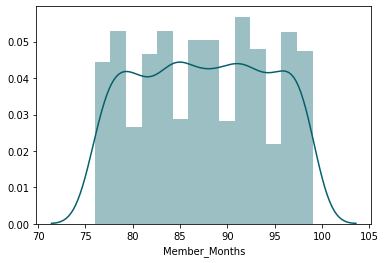

In [43]:
sns.distplot(df['Member_Months'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['Member_Months'], name = 'Member_Months', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Signed Up months', width=500, height=500)
fig.show()

Plotting Histogram and Boxplot for 'Member_Months' from two clusters (accepted and didn't accept 6th campaign):

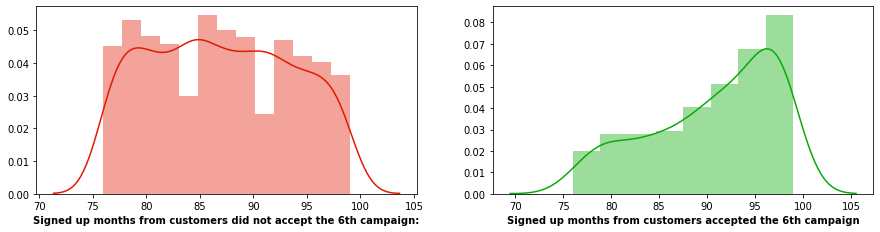

In [44]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['Member_Months'],kde=True, color = '#E11901')
plt.xlabel('Signed up months from customers did not accept the 6th campaign:', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['Member_Months'],kde=True, color = '#08AA09')
plt.xlabel('Signed up months from customers accepted the 6th campaign', fontweight="bold")

plt.show()

In [45]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['Member_Months'], x=df[df['Response']==0]['Response'], name='Did not accept 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['Member_Months'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Signed Up months', height=500)
fig.show()

Signed up months from customers accepted the 6th campaign:

In [46]:
df[df['Response']==1]['Member_Months'].describe()

count    334.000000
mean      90.661677
std        6.577505
min       76.000000
25%       86.000000
50%       92.000000
75%       96.000000
max       99.000000
Name: Member_Months, dtype: float64

Signed up months from customers didn't accept the 6th campaign:

In [47]:
df[df['Response']==0]['Member_Months'].describe()

count    1905.000000
mean       86.980577
std         6.635161
min        76.000000
25%        81.000000
50%        87.000000
75%        92.000000
max        99.000000
Name: Member_Months, dtype: float64

Signed up months median from customers who accepted the 6th campaign is greater than signed up months median from customers didn't accept it.

Signed up months standard deviation of customers who accepted the 6th campaign is similar for customers didn't accept it.

The histogram from signed up months from customers who accepted the 6th campaign has negative skew.

There aren't any outliers.

##### Analysing 'Recency':

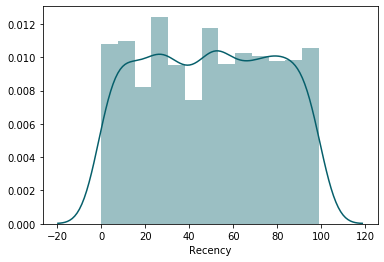

In [48]:
sns.distplot(df['Recency'], kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['Recency'], name='', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Recency', width=500, height=500)
fig.show()

Plotting Histogram and Boxplot for 'Recency' from two clusters (accepted and don't accepted 6th campaign):

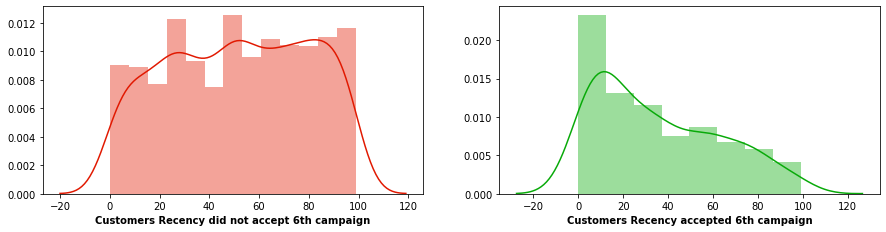

In [49]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['Recency'],kde=True, color = '#E11901')
plt.xlabel('Customers Recency did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['Recency'],kde=True, color = '#08AA09')
plt.xlabel('Customers Recency accepted 6th campaign', fontweight="bold")

plt.show()

In [50]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['Recency'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['Recency'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Recency', height=500)
fig.show()

Recency from customers accepted the 6th campaign:

In [51]:
df[df['Response']==1]['Recency'].describe()

count    334.000000
mean      35.383234
std       27.659499
min        0.000000
25%       11.000000
50%       30.000000
75%       56.000000
max       99.000000
Name: Recency, dtype: float64

Recency from customers didn't accept the 6th campaign:

In [52]:
df[df['Response']==0]['Recency'].describe()

count    1905.000000
mean       51.529659
std        28.519091
min         0.000000
25%        27.000000
50%        52.000000
75%        77.000000
max        99.000000
Name: Recency, dtype: float64

Recency median from customers who accepted the 6th campaign is lower than Recency median from customers didn't accept it. Thus, customers accepted the 6th campaign spent less days to do a new purchase.

Recency standard deviation of customers who accepted the 6th campaign is similar to Recency standard deviation of customers didn't accept it.

The histogram of Recency from customers accepted the 6th campaign has positive skew.

There aren't any outliers to Recency.

##### Analysing 'MntWines':

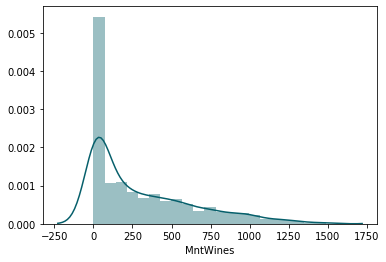

In [53]:
sns.distplot(df['MntWines'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['MntWines'], name='Wine', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Amount spent on Wine', width=500, height=500)
fig.show()

In [54]:
print('Number of customers that Amount Spent on Wines more than upper fence:', 
      df[df['MntWines']>1224]['MntWines'].count(), '\n' 'But I will not drop them now.')

Number of customers that Amount Spent on Wines more than upper fence: 35 
But I will not drop them now.


Plotting Histogram and Boxplot for 'MntWines' from two clusters (accepted and don't accepted 6th campaign):

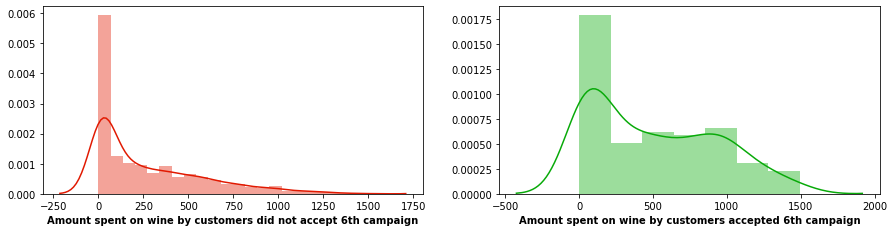

In [55]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntWines'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on wine by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntWines'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on wine by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [56]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntWines'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntWines'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on wine', height=500)
fig.show()

MntWines from customers accepted the 6th campaign:

In [57]:
df[df['Response']==1]['MntWines'].describe()

count     334.000000
mean      502.703593
std       427.183786
min         1.000000
25%        96.000000
50%       448.000000
75%       875.500000
max      1492.000000
Name: MntWines, dtype: float64

MntWines from customers didn't accept the 6th campaign:

In [58]:
df[df['Response']==0]['MntWines'].describe()

count    1905.000000
mean      269.240945
std       305.181073
min         0.000000
25%        22.000000
50%       152.000000
75%       444.000000
max      1493.000000
Name: MntWines, dtype: float64

In [59]:
Q1 = df[df['Response']==0]['MntWines'].quantile(0.25)
Q3 = df[df['Response']==0]['MntWines'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['MntWines'] > upper_fence)]['MntWines'].count(), 'outliers of Amount spent on wine by customers did not accept the 6th campaign.')

Upper Fence = 1077.0
There are 40 outliers of Amount spent on wine by customers did not accept the 6th campaign.


In [60]:
df[(df['Response']==0) & (df['MntWines']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
161,PhD,Married,70356.0,0,0,20,1349,16,249,43,16,33,2,10,6,9,6,0,0,0,0,0,0,0,75.0,96
175,PhD,Married,80427.0,0,1,56,1149,71,449,69,71,26,1,11,8,8,5,0,0,0,0,0,0,0,45.0,98
295,Master,Together,55951.0,0,1,62,1241,0,80,0,13,40,3,3,6,11,8,0,1,0,0,1,0,0,68.0,98
342,PhD,Married,55212.0,0,1,65,1103,0,45,0,0,34,3,4,2,11,8,0,1,0,0,1,0,0,51.0,95
412,PhD,Married,66465.0,0,1,1,1200,0,204,38,29,14,3,11,9,12,6,0,0,0,1,0,0,0,65.0,91
424,PhD,Married,93027.0,0,0,77,1285,42,716,55,0,21,0,7,10,5,2,0,0,1,0,0,0,0,79.0,90
490,PhD,Together,78952.0,0,1,11,1170,19,594,99,76,134,2,2,5,12,6,0,0,0,0,0,0,0,62.0,97
497,PhD,Together,78642.0,0,1,83,1396,0,322,46,35,17,1,4,9,4,6,0,0,0,0,0,0,0,49.0,90
513,Master,Together,89120.0,0,0,78,1168,92,408,72,129,55,1,5,6,7,1,0,0,1,0,0,0,0,61.0,79
515,Master,Single,81169.0,0,0,47,1288,20,613,80,61,27,1,5,7,9,2,0,0,0,0,0,0,0,45.0,90


Replacing outliers of Amount spent on wine by customers did not accept the 6th campaign by the median:

In [61]:
df['MntWines'] = np.where((df['Response']==0) & (df['MntWines']>upper_fence), df[df['Response']==0]['MntWines'].median(), df['MntWines'])

Look at the new histogram boxplot:

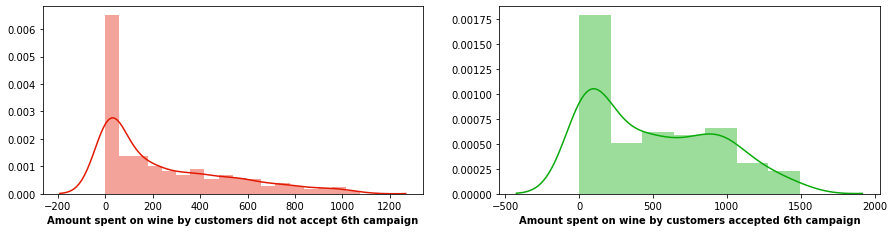

In [62]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntWines'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on wine by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntWines'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on wine by customers accepted 6th campaign', fontweight="bold")

plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntWines'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntWines'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on wine', height=500)
fig.show()

Median amount spent on wine by customers accepted the 6th campaign is bigger than median amount spent on wine by customers didn't accept it.

The standard deviation of amount spent on wine by customers accepted the 6th campaign is bigger than standard deviation amount spent on wine by customers didn't accept it.

Look at skewness. The histogram of amount spent on wine by customers accepted the 6th campaign has positive skew.

##### Analysing 'MntFruits':

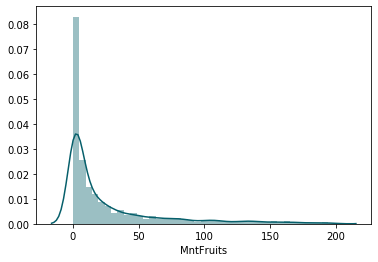

In [63]:
sns.distplot(df['MntFruits'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['MntFruits'], name='Fruits', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Amount spent on Fruits', width=500, height=500)
fig.show()

In [64]:
print('Number of customers that Amount Spent on Fruits more than upper fence:', df[df['MntFruits']>81]['MntFruits'].count(), '\n' 'But I will not drop them now.')

Number of customers that Amount Spent on Fruits more than upper fence: 227 
But I will not drop them now.


Plotting Histogram and Boxplot for 'MntFruits' from two clusters (accepted and don't accepted 6th campaign):

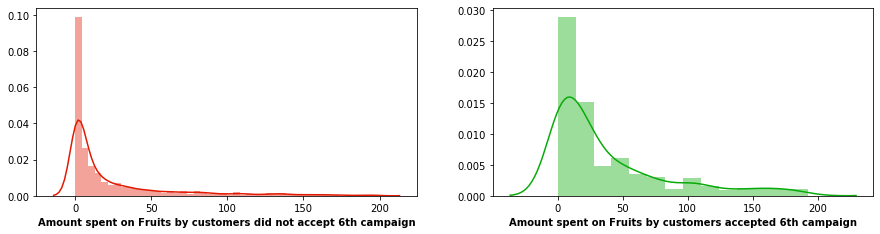

In [65]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntFruits'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Fruits by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntFruits'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Fruits by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [66]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntFruits'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntFruits'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Fruits', height=500)
fig.show()

MntFruits from customers accepted the 6th campaign:

In [67]:
df[df['Response']==1]['MntFruits'].describe()

count    334.000000
mean      38.203593
std       46.099519
min        0.000000
25%        4.000000
50%       21.000000
75%       53.750000
max      193.000000
Name: MntFruits, dtype: float64

In [68]:
Q1 = df[df['Response']==1]['MntFruits'].quantile(0.25)
Q3 = df[df['Response']==1]['MntFruits'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==1) & (df['MntFruits'] > upper_fence)]['MntFruits'].count(), 'outliers of Amount spent on fruits by customers that accepted the 6th campaign.')

Upper Fence = 128.375
There are 25 outliers of Amount spent on fruits by customers that accepted the 6th campaign.


In [69]:
df[(df['Response']==1) & (df['MntFruits']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
126,Graduation,Single,79607.0,0,0,37,450.0,133,951,173,0,216,1,3,6,6,1,0,0,0,0,0,0,1,36.0,90
243,Graduation,Married,73687.0,0,0,8,559.0,153,503,218,13,181,1,3,9,9,2,0,0,0,1,0,0,1,30.0,83
252,Graduation,Divorced,102692.0,0,0,5,168.0,148,444,32,172,148,1,6,9,13,2,0,1,1,1,1,0,1,46.0,91
276,Graduation,Single,60714.0,0,0,56,216.0,162,224,101,92,162,2,7,4,10,5,0,0,0,0,0,0,1,64.0,93
336,Graduation,Divorced,75693.0,0,0,10,797.0,153,293,72,97,30,1,11,4,6,4,0,1,1,1,0,0,1,52.0,95
537,Graduation,Divorced,76982.0,0,0,19,464.0,151,292,65,60,30,1,8,3,4,4,0,0,1,0,0,0,1,53.0,80
591,Master,Married,92163.0,0,0,25,817.0,183,797,106,163,20,0,5,11,5,2,0,0,1,1,0,0,1,45.0,95
646,Graduation,Together,105471.0,0,0,36,1009.0,181,104,202,21,207,0,9,8,13,3,0,0,1,1,0,0,1,50.0,93
753,Graduation,Married,80952.0,0,0,20,778.0,178,689,41,27,44,1,8,5,11,8,0,1,1,1,0,0,1,51.0,92
984,Graduation,Married,80763.0,0,0,17,674.0,168,108,192,42,231,1,5,11,6,3,0,0,1,1,0,0,1,70.0,86


Replacing outliers of Amount spent on fruits by customers that accepted the 6th campaign by the median:

In [70]:
df['MntFruits'] = np.where((df['Response']==1) & (df['MntFruits']>upper_fence), df[df['Response']==1]['MntFruits'].median(), df['MntFruits'])

MntFruits from customers didn't accept the 6th campaign:

In [71]:
df[df['Response']==0]['MntFruits'].describe()

count    1905.000000
mean       24.222047
std        38.201073
min         0.000000
25%         1.000000
50%         7.000000
75%        28.000000
max       199.000000
Name: MntFruits, dtype: float64

In [72]:
Q1 = df[df['Response']==0]['MntFruits'].quantile(0.25)
Q3 = df[df['Response']==0]['MntFruits'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['MntFruits'] > upper_fence)]['MntFruits'].count(), 'outliers of Amount spent on fruits by customers did not accept the 6th campaign.')

Upper Fence = 68.5
There are 228 outliers of Amount spent on fruits by customers did not accept the 6th campaign.


In [73]:
df[(df['Response']==0) & (df['MntFruits']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
18,Master,Married,76995.0,0,1,91,1012.0,80.0,498,0,16,176,2,11,4,9,5,0,0,0,1,0,0,0,71.0,91
29,PhD,Married,84618.0,0,0,96,684.0,100.0,801,21,66,0,1,6,9,10,2,0,0,1,0,0,0,0,55.0,83
40,Graduation,Married,80011.0,0,1,3,421.0,76.0,536,82,178,102,2,8,6,5,4,0,0,0,0,0,0,0,40.0,90
45,Graduation,Single,79941.0,0,0,72,123.0,164.0,266,227,30,174,1,2,4,9,1,0,0,0,0,0,0,0,44.0,76
72,Graduation,Married,65031.0,0,1,29,258.0,107.0,291,84,37,86,4,10,3,13,7,0,0,0,0,0,0,0,61.0,91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2187,PhD,Married,84117.0,0,0,60,611.0,76.0,749,59,45,26,1,7,10,6,2,0,0,1,0,0,0,0,64.0,77
2203,Graduation,Married,73807.0,0,1,88,366.0,124.0,156,71,78,54,2,5,5,11,2,0,0,0,0,0,0,0,42.0,94
2206,Graduation,Married,61014.0,0,1,17,269.0,129.0,495,182,43,29,4,9,3,4,7,0,0,0,0,0,0,0,40.0,99
2211,Graduation,Together,88325.0,0,0,42,519.0,71.0,860,93,27,53,1,6,2,9,2,0,0,0,0,0,0,0,39.0,81


Replacing outliers of Amount spent on fruits by customers didn't accept the 6th campaign by the median:

In [74]:
df['MntFruits'] = np.where((df['Response']==0) & (df['MntFruits']>upper_fence), df[df['Response']==0]['MntFruits'].median(), df['MntFruits'])

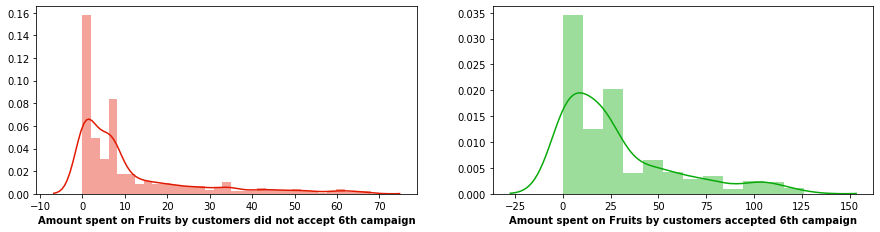

In [75]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntFruits'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Fruits by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntFruits'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Fruits by customers accepted 6th campaign', fontweight="bold")

plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntFruits'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntFruits'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Fruits', height=500)
fig.show()

Median of Amount spent on fruits by customers that accepted the 6th campaign is bigger than median of Amount spent on fruits by customers didn't accept it.

Standard deviation of Amount spent on fruits by customers that accepted the 6th campaign is bigger Standard deviation of Amount spent on fruits by customers didn't accept it.

Look at skewness. The histogram of of Amount spent on fruits by customers that accepted the 6th campaign has positive skew.

##### Analysing 'MntMeatProducts':

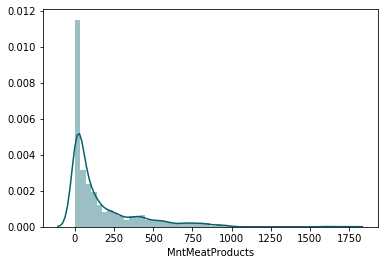

In [76]:
sns.distplot(df['MntMeatProducts'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['MntMeatProducts'], name='Meat Products', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Amount spent on Meat Products', width=500, height=500)
fig.show()

In [77]:
print('Number of customers that Amount Spent on Meat Products more than upper fence:', df[df['MntMeatProducts']>555]['MntMeatProducts'].count(), '\n' 'But I will not drop them now.')

Number of customers that Amount Spent on Meat Products more than upper fence: 175 
But I will not drop them now.


Plotting Histogram and Boxplot for 'MntMeatProducts' from two clusters (accepted and don't accepted 6th campaign):

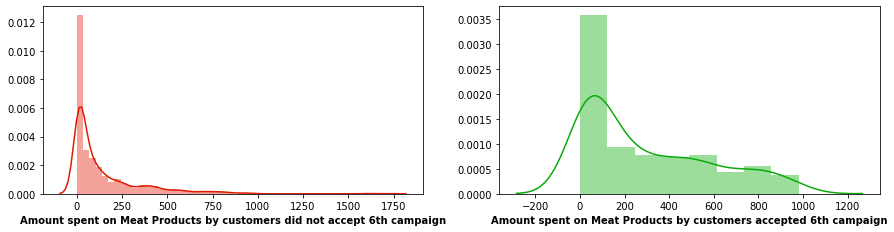

In [78]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntMeatProducts'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Meat Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntMeatProducts'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Meat Products by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [79]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntMeatProducts'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntMeatProducts'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Meat Products', height=500)
fig.show()

MntMeatProducts from customers accepted the 6th campaign:

In [80]:
df[df['Response']==1]['MntMeatProducts'].describe()

count    334.000000
mean     294.353293
std      286.890036
min        1.000000
25%       47.750000
50%      174.500000
75%      509.750000
max      981.000000
Name: MntMeatProducts, dtype: float64

MntMeatProducts from customers didn't accept the 6th campaign:

In [81]:
df[df['Response']==0]['MntMeatProducts'].describe()

count    1905.000000
mean      144.690814
std       205.333326
min         0.000000
25%        14.000000
50%        56.000000
75%       193.000000
max      1725.000000
Name: MntMeatProducts, dtype: float64

In [82]:
Q1 = df[df['Response']==0]['MntMeatProducts'].quantile(0.25)
Q3 = df[df['Response']==0]['MntMeatProducts'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['MntMeatProducts'] > upper_fence)]['MntMeatProducts'].count(), 'outliers of Amount spent on Meat Products by customers did not accept the 6th campaign.')

Upper Fence = 461.5
There are 158 outliers of Amount spent on Meat Products by customers did not accept the 6th campaign.


In [83]:
df[(df['Response']==0) & (df['MntMeatProducts']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
12,Graduation,Divorced,63033.0,0,0,82,194.0,61.0,480,225,112,30,1,3,4,8,2,0,0,0,0,0,0,0,61.0,83
18,Master,Married,76995.0,0,1,91,1012.0,7.0,498,0,16,176,2,11,4,9,5,0,0,0,1,0,0,0,71.0,91
21,Graduation,Married,2447.0,1,0,42,1.0,1.0,1725,1,1,1,15,0,28,0,1,0,0,0,0,0,0,0,41.0,94
29,PhD,Married,84618.0,0,0,96,684.0,7.0,801,21,66,0,1,6,9,10,2,0,0,1,0,0,0,0,55.0,83
34,Master,Married,68657.0,0,0,4,482.0,34.0,471,119,68,22,1,3,5,9,7,0,0,0,0,0,0,0,74.0,92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2188,Master,Together,65487.0,0,0,48,240.0,67.0,500,199,0,163,3,3,5,6,2,0,0,0,0,0,0,0,63.0,81
2206,Graduation,Married,61014.0,0,1,17,269.0,7.0,495,182,43,29,4,9,3,4,7,0,0,0,0,0,0,0,40.0,99
2211,Graduation,Together,88325.0,0,0,42,519.0,7.0,860,93,27,53,1,6,2,9,2,0,0,0,0,0,0,0,39.0,81
2213,2n Cycle,Single,80617.0,0,0,42,594.0,51.0,631,72,55,32,1,4,6,8,2,0,0,0,0,0,0,0,25.0,97


Replacing outliers of Amount spent on Meat Products by customers didn't accept the 6th campaign by the median:

In [84]:
df['MntMeatProducts'] = np.where((df['Response']==0) & (df['MntMeatProducts']>upper_fence), df[df['Response']==0]['MntMeatProducts'].median(), df['MntMeatProducts'])

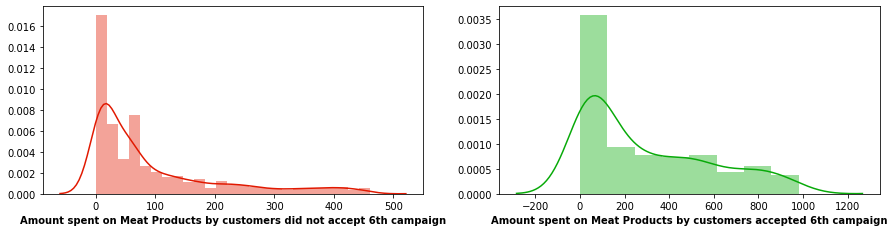

In [85]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntMeatProducts'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Meat Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntMeatProducts'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Meat Products by customers accepted 6th campaign', fontweight="bold")
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntMeatProducts'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntMeatProducts'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Meat Products', height=500)
fig.show()

Median of Amount spent on Meat Products by customers accepted the 6th campaign is bigger than Median of Amount spent on Meat Products by customers didn't accept it.

Standard deviation of amount spent on Meat Products by customers accepted the 6th campaign is bigger than Standard deviation of amount spent on Meat Products by customers didn't accept it.

Look at skewness. The histogram of amount spent on Meat Products by customers accepted the 6th campaign has positive skew.

On box plot of amount spent on Meat Products by customers that accepted the 6th campaign there aren't outliers.

###### Analysing 'MntFishProducts':

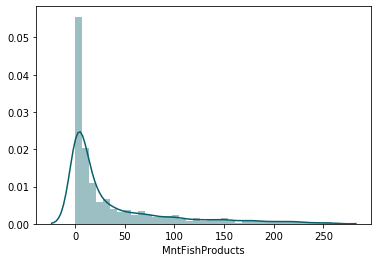

In [86]:
sns.distplot(df['MntFishProducts'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['MntFishProducts'], name='Fish Products', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Amount spent on Fish Products', width=500, height=500)
fig.show()

In [87]:
print('Number of customers that Amount Spent on Fish Products more than upper fence: ', df[df['MntFishProducts']>120]['MntFishProducts'].count(), '\n' 'But I will not drop them now.')

Number of customers that Amount Spent on Fish Products more than upper fence:  223 
But I will not drop them now.


Plotting Histogram and Boxplot for 'MntFishProducts' from two clusters (accepted and don't accepted 6th campaign):

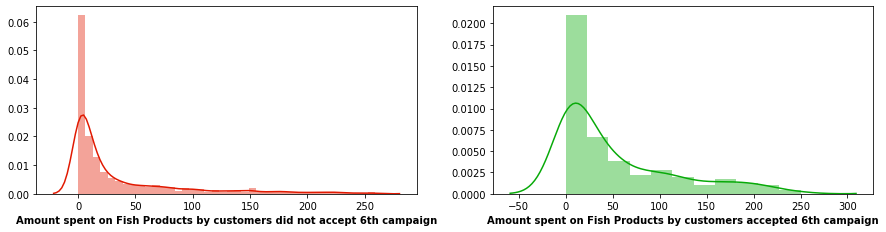

In [88]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntFishProducts'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Fish Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntFishProducts'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Fish Products by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [89]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntFishProducts'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntFishProducts'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Fish Products', height=500)
fig.show()

MntFishProducts from customers accepted the 6th campaign:

In [90]:
df[df['Response']==1]['MntFishProducts'].describe()

count    334.000000
mean      52.050898
std       61.855885
min        0.000000
25%        4.000000
50%       25.000000
75%       84.250000
max      250.000000
Name: MntFishProducts, dtype: float64

In [91]:
Q1 = df[df['Response']==1]['MntFishProducts'].quantile(0.25)
Q3 = df[df['Response']==1]['MntFishProducts'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==1) & (df['MntFishProducts'] > upper_fence)]['MntFishProducts'].count(), 'outliers of Amount spent on Fish Products by customers that accepted the 6th campaign.')

Upper Fence = 204.625
There are 11 outliers of Amount spent on Fish Products by customers that accepted the 6th campaign.


In [92]:
df[(df['Response']==1) & (df['MntFishProducts']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
243,Graduation,Married,73687.0,0,0,8,559.0,21.0,503.0,218,13,181,1,3,9,9,2,0,0,0,1,0,0,1,30.0,83
914,Graduation,Single,95529.0,0,0,29,770.0,29.0,890.0,250,27,24,1,7,3,7,3,0,0,1,0,0,0,1,26.0,95
1089,PhD,Single,71691.0,0,0,0,336.0,21.0,411.0,240,32,43,1,4,7,5,2,0,0,0,0,0,0,1,62.0,79
1190,Master,Divorced,78579.0,0,0,35,816.0,66.0,549.0,216,66,99,1,5,6,4,3,0,0,0,0,0,0,1,50.0,94
1298,Graduation,Married,78569.0,0,0,14,558.0,79.0,622.0,207,175,95,1,4,6,4,1,0,0,1,0,0,0,1,74.0,80
1413,Graduation,Married,80589.0,0,0,25,507.0,93.0,520.0,242,40,26,1,5,10,5,1,0,0,0,1,0,0,1,76.0,81
1808,Graduation,Married,90369.0,0,0,2,292.0,51.0,981.0,224,23,17,1,4,6,6,1,0,0,0,0,0,0,1,64.0,78
1827,Graduation,Together,78394.0,0,0,13,298.0,27.0,697.0,216,24,166,1,4,6,5,2,0,0,0,0,0,0,1,34.0,92
1946,Graduation,Married,63211.0,0,0,3,145.0,21.0,459.0,205,26,145,2,3,8,7,2,0,0,0,0,0,0,1,38.0,96
2048,Graduation,Single,76467.0,1,0,44,676.0,21.0,426.0,210,44,58,2,2,5,5,6,0,0,0,0,0,0,1,50.0,98


Replacing outliers of Amount spent on Fish Products by customers that accepted the 6th campaign by the median:

In [93]:
df['MntFishProducts'] = np.where((df['Response']==1) & (df['MntFishProducts']>upper_fence), df[df['Response']==1]['MntFishProducts'].median(), df['MntFishProducts'])

MntFishProducts from customers didn't accept the 6th campaign:

In [94]:
df[df['Response']==0]['MntFishProducts'].describe()

count    1905.000000
mean       34.994226
std        52.880518
min         0.000000
25%         2.000000
50%        11.000000
75%        43.000000
max       259.000000
Name: MntFishProducts, dtype: float64

In [95]:
Q1 = df[df['Response']==0]['MntFishProducts'].quantile(0.25)
Q3 = df[df['Response']==0]['MntFishProducts'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['MntFishProducts'] > upper_fence)]['MntFishProducts'].count(), 'outliers of Amount spent on Fish Products by customers did not accept the 6th campaign.')

Upper Fence = 104.5
There are 201 outliers of Amount spent on Fish Products by customers did not accept the 6th campaign.


In [96]:
df[(df['Response']==0) & (df['MntFishProducts']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
2,Graduation,Together,71613.0,0,0,26,426.0,49.0,127.0,111.0,21,42,1,8,2,10,4,0,0,0,0,0,0,0,55.0,86
12,Graduation,Divorced,63033.0,0,0,82,194.0,61.0,56.0,225.0,112,30,1,3,4,8,2,0,0,0,0,0,0,0,61.0,83
17,Graduation,Together,37760.0,0,0,20,84.0,5.0,38.0,150.0,12,28,2,4,1,6,7,0,0,0,0,0,0,0,74.0,98
34,Master,Married,68657.0,0,0,4,482.0,34.0,56.0,119.0,68,22,1,3,5,9,7,0,0,0,0,0,0,0,74.0,92
45,Graduation,Single,79941.0,0,0,72,123.0,7.0,266.0,227.0,30,174,1,2,4,9,1,0,0,0,0,0,0,0,44.0,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2176,Master,Divorced,81380.0,0,0,51,741.0,68.0,56.0,224.0,68,103,1,4,2,10,2,0,0,0,0,0,0,0,53.0,94
2186,Master,Married,76234.0,0,1,21,519.0,50.0,167.0,130.0,0,41,1,8,3,11,3,0,1,0,0,0,0,0,48.0,80
2188,Master,Together,65487.0,0,0,48,240.0,67.0,56.0,199.0,0,163,3,3,5,6,2,0,0,0,0,0,0,0,63.0,81
2206,Graduation,Married,61014.0,0,1,17,269.0,7.0,56.0,182.0,43,29,4,9,3,4,7,0,0,0,0,0,0,0,40.0,99


Replacing outliers of Amount spent on Fish Products by customers didn't accept the 6th campaign by the median:

In [97]:
df['MntFishProducts'] = np.where((df['Response']==0) & (df['MntFishProducts']>upper_fence), df[df['Response']==0]['MntFishProducts'].median(), df['MntFishProducts'])

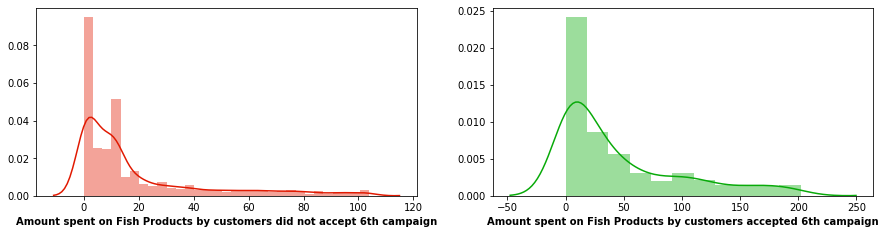

In [98]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntFishProducts'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Fish Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntFishProducts'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Fish Products by customers accepted 6th campaign', fontweight="bold")
plt.show()


fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntFishProducts'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntFishProducts'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Fish Products', height=500)
fig.show()

In [99]:
df[df['Response']==1]['MntFishProducts'].describe()

count    334.000000
mean      45.568862
std       53.376557
min        0.000000
25%        4.000000
50%       25.000000
75%       68.750000
max      202.000000
Name: MntFishProducts, dtype: float64

In [100]:
df[df['Response']==0]['MntFishProducts'].describe()

count    1905.000000
mean       18.625197
std        24.442807
min         0.000000
25%         2.000000
50%        11.000000
75%        23.000000
max       104.000000
Name: MntFishProducts, dtype: float64

Median of Amount spent on Fish Products by customers accepted the 6th campaign is bigger than Median of Amount spent on Fish Products by customers didn't accept it.

Standard deviation of amount spent on Fish Products by customers accepted the 6th campaign is bigger than Standard deviation of amount spent on Fish Products by customers didn't accept it.

Look at skewness. The histogram of amount spent on Fish Products by customers accepted the 6th campaign has positive skew.

##### Analysing 'MntSweetProducts':

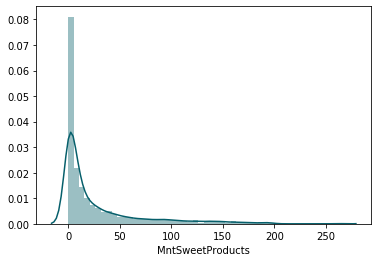

In [101]:
sns.distplot(df['MntSweetProducts'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['MntSweetProducts'], name='Sweet Products', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Amount spent on Sweet Products', width=500, height=500)
fig.show()

In [102]:
print('Number of customers that Amount Spent on Sweet Products more than upper fence: ', df[df['MntSweetProducts']>81]['MntSweetProducts'].count(), '\n' 'But I will not drop them now.')

Number of customers that Amount Spent on Sweet Products more than upper fence:  248 
But I will not drop them now.


Plotting Histogram and Boxplot for 'MntSweetProducts' from two clusters (accepted and don't accepted 6th campaign):

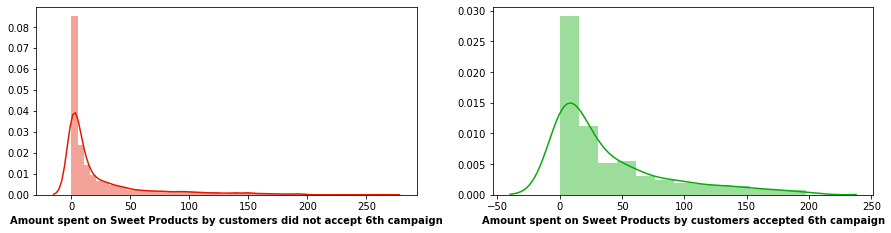

In [103]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntSweetProducts'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Sweet Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntSweetProducts'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Sweet Products by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [104]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntSweetProducts'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntSweetProducts'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Sweet Products', height=500)
fig.show()

MntSweetProducts from customers accepted the 6th campaign:

In [105]:
df[df['Response']==1]['MntSweetProducts'].describe()

count    334.000000
mean      38.634731
std       46.327903
min        0.000000
25%        3.000000
50%       20.000000
75%       57.000000
max      198.000000
Name: MntSweetProducts, dtype: float64

In [106]:
Q1 = df[df['Response']==1]['MntSweetProducts'].quantile(0.25)
Q3 = df[df['Response']==1]['MntSweetProducts'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==1) & (df['MntSweetProducts'] > upper_fence)]['MntSweetProducts'].count(), 'outliers of Amount spent on Sweet Products by customers that accepted the 6th campaign.')

Upper Fence = 138.0
There are 19 outliers of Amount spent on Sweet Products by customers that accepted the 6th campaign.


In [107]:
df[(df['Response']==1) & (df['MntSweetProducts']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
203,PhD,Together,102160.0,0,0,54,763.0,29.0,138.0,76.0,176,58,0,7,9,10,4,0,1,1,1,0,0,1,43.0,96
252,Graduation,Divorced,102692.0,0,0,5,168.0,21.0,444.0,32.0,172,148,1,6,9,13,2,0,1,1,1,1,0,1,46.0,91
347,Graduation,Divorced,84835.0,0,0,0,189.0,104.0,379.0,111.0,189,218,1,4,4,6,1,0,0,0,0,0,0,1,50.0,76
456,2n Cycle,Single,89572.0,0,0,44,606.0,24.0,974.0,197.0,194,64,1,7,7,9,4,0,1,0,1,0,0,1,54.0,97
591,Master,Married,92163.0,0,0,25,817.0,21.0,797.0,106.0,163,20,0,5,11,5,2,0,0,1,1,0,0,1,45.0,95
634,Graduation,Single,83917.0,0,0,12,514.0,22.0,732.0,42.0,198,79,1,6,7,7,3,0,0,0,0,0,0,1,47.0,90
956,Graduation,Married,59754.0,0,1,96,115.0,27.0,44.0,4.0,146,139,3,5,2,6,5,0,0,0,0,0,0,1,55.0,95
1100,Graduation,Divorced,83829.0,0,0,78,897.0,21.0,430.0,186.0,161,27,0,4,7,6,1,1,0,1,1,0,0,1,45.0,85
1111,2n Cycle,Single,81698.0,0,0,1,709.0,45.0,115.0,30.0,160,45,1,8,2,5,5,0,0,0,1,0,0,1,37.0,92
1265,Graduation,Divorced,83829.0,0,0,78,897.0,21.0,430.0,186.0,161,27,0,4,7,6,1,1,0,1,1,0,0,1,45.0,85


Replacing outliers of Amount spent on Sweet Products by customers that accepted the 6th campaign by the median:

In [108]:
df['MntSweetProducts'] = np.where((df['Response']==1) & (df['MntSweetProducts']>upper_fence), df[df['Response']==1]['MntSweetProducts'].median(), df['MntSweetProducts'])

MntSweetProducts from customers didn't accept the 6th campaign:

In [109]:
df[df['Response']==0]['MntSweetProducts'].describe()

count    1905.000000
mean       25.047769
std        40.007777
min         0.000000
25%         1.000000
50%         7.000000
75%        30.000000
max       263.000000
Name: MntSweetProducts, dtype: float64

In [110]:
Q1 = df[df['Response']==0]['MntSweetProducts'].quantile(0.25)
Q3 = df[df['Response']==0]['MntSweetProducts'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['MntSweetProducts'] > upper_fence)]['MntSweetProducts'].count(), 'outliers of Amount spent on Sweet Products by customers did not accept the 6th campaign.')

Upper Fence = 73.5
There are 219 outliers of Amount spent on Sweet Products by customers did not accept the 6th campaign.


In [111]:
df[(df['Response']==0) & (df['MntSweetProducts']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
12,Graduation,Divorced,63033.0,0,0,82,194.0,61.0,56.0,11.0,112.0,30,1,3,4,8,2,0,0,0,0,0,0,0,61.0,83
27,Graduation,Single,51381.5,1,0,19,5.0,1.0,3.0,3.0,263.0,362,0,27,0,0,1,0,0,0,0,0,0,0,34.0,92
40,Graduation,Married,80011.0,0,1,3,421.0,7.0,56.0,82.0,178.0,102,2,8,6,5,4,0,0,0,0,0,0,0,40.0,90
51,Master,Married,79143.0,0,0,2,650.0,37.0,56.0,27.0,167.0,32,1,6,9,13,3,0,0,0,0,0,0,0,56.0,99
64,Graduation,Together,70666.0,0,0,29,398.0,40.0,367.0,11.0,122.0,30,1,7,4,4,4,0,0,0,0,0,0,0,72.0,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2168,Graduation,Married,90000.0,0,0,91,675.0,7.0,133.0,94.0,192.0,241,1,4,8,5,1,1,0,1,1,0,0,0,36.0,82
2172,Graduation,Together,60934.0,0,1,41,224.0,7.0,155.0,11.0,93.0,54,2,6,4,11,4,0,0,0,0,0,0,0,45.0,81
2203,Graduation,Married,73807.0,0,1,88,366.0,7.0,156.0,71.0,78.0,54,2,5,5,11,2,0,0,0,0,0,0,0,42.0,94
2217,PhD,Widow,82032.0,0,0,54,332.0,7.0,377.0,11.0,125.0,57,0,4,6,7,1,0,0,0,0,0,0,0,72.0,79


Replacing outliers of Amount spent on Sweet Products by customers didn't accept the 6th campaign by the median:

In [112]:
df['MntSweetProducts'] = np.where((df['Response']==0) & (df['MntSweetProducts']>upper_fence), df[df['Response']==0]['MntSweetProducts'].median(), df['MntSweetProducts'])

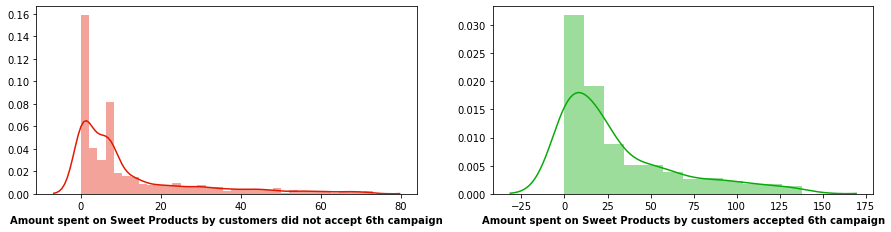

In [113]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntSweetProducts'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Sweet Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntSweetProducts'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Sweet Products by customers accepted 6th campaign', fontweight="bold")
plt.show()


fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntSweetProducts'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntSweetProducts'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Sweet Products', height=500)
fig.show()

Median of Amount spent on Sweet Products by customers accepted the 6th campaign is bigger than Median of Amount spent on Sweet Products by customers didn't accept it.

Standard deviation of amount spent on Sweet Products by customers accepted the 6th campaign is bigger than Standard deviation of amount spent on Sweet Products by customers didn't accept it.

Look at skewness. The histogram of amount spent on Sweet Products by customers accepted the 6th campaign has positive skew.

##### Analysing 'MntGoldProds':

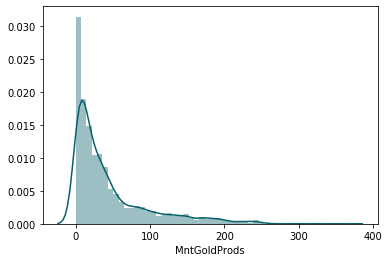

In [114]:
sns.distplot(df['MntGoldProds'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['MntGoldProds'], name='Gold Prods', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Amount spent on Gold Products', width=500, height=500)
fig.show()

In [115]:
print('Number of customers that Amount Spent on Gold Prods more than upper fence: ', df[df['MntGoldProds']>126]['MntGoldProds'].count(), '\n' 'But I will not drop them now.')

Number of customers that Amount Spent on Gold Prods more than upper fence:  207 
But I will not drop them now.


Plotting Histogram and Boxplot for 'MntGoldProds' from two clusters (accepted and don't accepted 6th campaign):

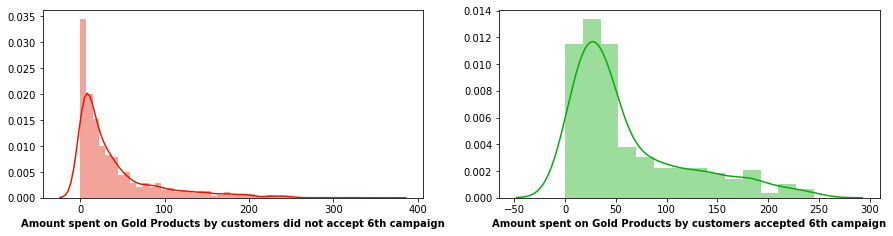

In [116]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntGoldProds'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Gold Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntGoldProds'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Gold Products by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [117]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntGoldProds'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntGoldProds'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Gold Products', height=500)
fig.show()

MntGoldProds from customers accepted the 6th campaign:

In [118]:
df[df['Response']==1]['MntGoldProds'].describe()

count    334.000000
mean      61.446108
std       57.507501
min        0.000000
25%       20.000000
50%       39.500000
75%       84.750000
max      245.000000
Name: MntGoldProds, dtype: float64

In [119]:
Q1 = df[df['Response']==1]['MntGoldProds'].quantile(0.25)
Q3 = df[df['Response']==1]['MntGoldProds'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==1) & (df['MntGoldProds'] > upper_fence)]['MntGoldProds'].count(), 'outliers of Amount spent on Gold Products by customers that accepted the 6th campaign.')

Upper Fence = 181.875
There are 21 outliers of Amount spent on Gold Products by customers that accepted the 6th campaign.


In [120]:
df[(df['Response']==1) & (df['MntGoldProds']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
53,Graduation,Divorced,82582.0,0,0,54,510.0,120.0,550.0,156.0,40.0,241,1,4,9,7,1,1,0,0,1,0,0,1,43.0,76
55,Master,Together,82384.0,0,0,55,984.0,51.0,432.0,180.0,120.0,190,1,3,10,13,1,0,0,1,0,0,0,1,65.0,95
126,Graduation,Single,79607.0,0,0,37,450.0,21.0,951.0,173.0,0.0,216,1,3,6,6,1,0,0,0,0,0,0,1,36.0,90
209,Graduation,Divorced,64497.0,0,1,17,1170.0,48.0,320.0,42.0,32.0,192,5,11,4,9,8,1,0,0,0,0,0,1,66.0,98
347,Graduation,Divorced,84835.0,0,0,0,189.0,104.0,379.0,111.0,20.0,218,1,4,4,6,1,0,0,0,0,0,0,1,50.0,76
586,Graduation,Widow,79800.0,0,0,65,1060.0,21.0,530.0,32.0,0.0,224,1,5,11,5,3,1,0,1,1,0,0,1,65.0,97
646,Graduation,Together,105471.0,0,0,36,1009.0,21.0,104.0,202.0,21.0,207,0,9,8,13,3,0,0,1,1,0,0,1,50.0,93
787,PhD,Divorced,42564.0,0,1,28,324.0,48.0,186.0,39.0,18.0,198,6,6,8,4,7,1,0,0,0,0,0,1,52.0,94
984,Graduation,Married,80763.0,0,0,17,674.0,21.0,108.0,192.0,42.0,231,1,5,11,6,3,0,0,1,1,0,0,1,70.0,86
987,Graduation,Married,75759.0,0,0,46,1394.0,22.0,708.0,89.0,91.0,182,1,9,7,9,5,1,0,1,1,0,0,1,51.0,84


Replacing outliers of Amount spent on Gold Products by customers that accepted the 6th campaign by the median:

In [121]:
df['MntGoldProds'] = np.where((df['Response']==1) & (df['MntGoldProds']>upper_fence), df[df['Response']==1]['MntGoldProds'].median(), df['MntGoldProds'])

MntGoldProds from customers didn't accept the 6th campaign:

In [122]:
df[df['Response']==0]['MntGoldProds'].describe()

count    1905.000000
mean       40.983727
std        50.584953
min         0.000000
25%         7.000000
50%        21.000000
75%        53.000000
max       362.000000
Name: MntGoldProds, dtype: float64

In [123]:
Q1 = df[df['Response']==0]['MntGoldProds'].quantile(0.25)
Q3 = df[df['Response']==0]['MntGoldProds'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['MntGoldProds'] > upper_fence)]['MntGoldProds'].count(), 'outliers of Amount spent on Gold Products by customers did not accept the 6th campaign.')

Upper Fence = 122.0
There are 167 outliers of Amount spent on Gold Products by customers did not accept the 6th campaign.


In [124]:
df[(df['Response']==0) & (df['MntGoldProds']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
18,Master,Married,76995.0,0,1,91,1012.0,7.0,56.0,0.0,16.0,176.0,2,11,4,9,5,0,0,0,1,0,0,0,71.0,91
27,Graduation,Single,51381.5,1,0,19,5.0,1.0,3.0,3.0,7.0,362.0,0,27,0,0,1,0,0,0,0,0,0,0,34.0,92
45,Graduation,Single,79941.0,0,0,72,123.0,7.0,266.0,11.0,30.0,174.0,1,2,4,9,1,0,0,0,0,0,0,0,44.0,76
62,Graduation,Single,61823.0,0,1,26,523.0,7.0,134.0,37.0,14.0,169.0,4,8,2,10,7,0,0,0,0,0,0,0,68.0,92
88,Graduation,Married,79593.0,0,0,70,350.0,60.0,56.0,11.0,7.0,145.0,1,5,6,7,2,0,0,1,0,0,0,0,47.0,77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2168,Graduation,Married,90000.0,0,0,91,675.0,7.0,133.0,94.0,7.0,241.0,1,4,8,5,1,1,0,1,1,0,0,0,36.0,82
2173,Graduation,Married,71965.0,0,1,21,572.0,19.0,286.0,50.0,38.0,248.0,3,6,3,5,3,0,0,0,0,0,0,0,69.0,87
2178,Graduation,Married,52914.0,0,1,32,254.0,10.0,44.0,30.0,10.0,227.0,2,7,3,3,7,1,0,0,0,0,0,0,49.0,94
2188,Master,Together,65487.0,0,0,48,240.0,67.0,56.0,11.0,0.0,163.0,3,3,5,6,2,0,0,0,0,0,0,0,63.0,81


Replacing outliers of Amount spent on Gold Products by customers didn't accept the 6th campaign by the median:

In [125]:
df['MntGoldProds'] = np.where((df['Response']==0) & (df['MntGoldProds']>upper_fence), df[df['Response']==0]['MntGoldProds'].median(), df['MntGoldProds'])

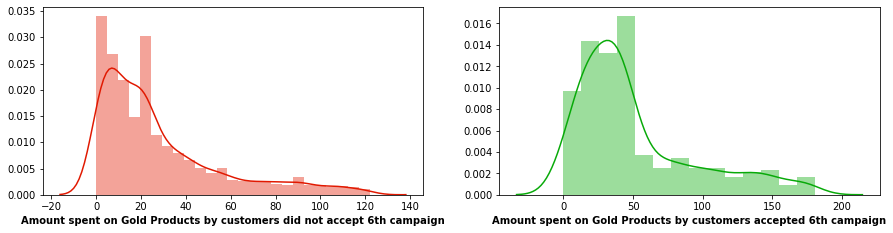

In [126]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['MntGoldProds'],kde=True, color = '#E11901')
plt.xlabel('Amount spent on Gold Products by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['MntGoldProds'],kde=True, color = '#08AA09')
plt.xlabel('Amount spent on Gold Products by customers accepted 6th campaign', fontweight="bold")
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['MntGoldProds'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['MntGoldProds'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Amount spent on Gold Products', height=500)
fig.show()

Median of Amount spent on Gold Products by customers who accepted the 6th campaign is bigger than Median of Amount spent on Gold Products by customers didn't accept it.

Standard deviation of amount spent on Gold Products by customers who accepted the 6th campaign is bigger than Standard deviation of amount spent on Gold Products by customers didn't accept it.

Look at skewness. The histogram of amount spent on Gold Products by customers who accepted the 6th campaign has positive skew.

##### Analysing 'NumDealsPurchases':

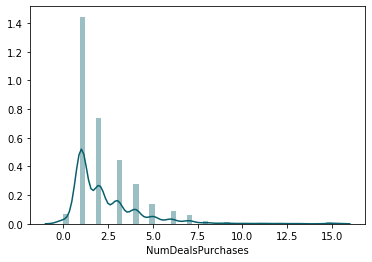

In [127]:
sns.distplot(df['NumDealsPurchases'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['NumDealsPurchases'], name='Deal Purchase', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Number of purchases made with discount', width=500, height=500)
fig.show()

In [128]:
print('Number of purchases made with discount more than upper fence: ', df[df['NumDealsPurchases']>6]['NumDealsPurchases'].count(), '\n' 'But I will not drop them now.')

Number of purchases made with discount more than upper fence:  86 
But I will not drop them now.


Plotting Histogram and Boxplot for 'NumDealsPurchases' from two clusters (accepted and don't accepted 6th campaign):

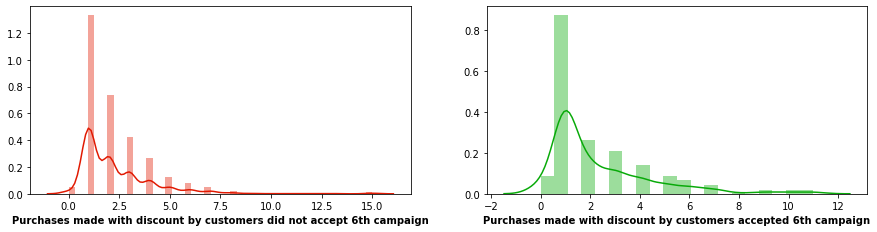

In [129]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumDealsPurchases'],kde=True, color = '#E11901')
plt.xlabel('Purchases made with discount by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumDealsPurchases'],kde=True, color = '#08AA09')
plt.xlabel('Purchases made with discount by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [130]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumDealsPurchases'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumDealsPurchases'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Purchases made with discount by customers', height=500)
fig.show()

NumDealsPurchases from customers accepted the 6th campaign:

In [131]:
df[df['Response']==1]['NumDealsPurchases'].describe()

count    334.000000
mean       2.335329
std        2.109924
min        0.000000
25%        1.000000
50%        1.000000
75%        3.000000
max       11.000000
Name: NumDealsPurchases, dtype: float64

In [132]:
Q1 = df[df['Response']==1]['NumDealsPurchases'].quantile(0.25)
Q3 = df[df['Response']==1]['NumDealsPurchases'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==1) & (df['NumDealsPurchases'] > upper_fence)]['NumDealsPurchases'].count(), 'outliers of Purchases made with discount by customers that accepted the 6th campaign.')

Upper Fence = 6.0
There are 18 outliers of Purchases made with discount by customers that accepted the 6th campaign.


In [133]:
df[(df['Response']==1) & (df['NumDealsPurchases']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
230,Graduation,Single,37070.0,1,1,30,231.0,7.0,137.0,4.0,15.0,39.0,9,5,1,8,7,0,0,0,0,0,0,1,54.0,91
404,PhD,Single,55521.0,1,2,11,416.0,0.0,26.0,0.0,0.0,4.0,9,6,3,6,7,0,1,0,0,0,0,1,65.0,84
472,PhD,Together,56937.0,1,0,81,746.0,8.0,125.0,11.0,8.0,8.0,7,8,6,9,6,0,1,0,0,0,0,1,39.0,99
627,Graduation,Together,70971.0,0,1,28,1001.0,17.0,572.0,93.0,125.0,17.0,7,11,11,5,7,0,0,0,0,0,0,1,60.0,97
772,Graduation,Single,42720.0,1,1,9,392.0,5.0,91.0,28.0,26.0,112.0,8,7,3,7,8,0,0,0,0,0,0,1,55.0,90
1022,PhD,Together,64504.0,1,2,81,986.0,36.0,168.0,16.0,0.0,108.0,7,11,3,4,7,0,0,0,0,0,0,1,67.0,92
1125,Graduation,Divorced,39552.0,1,1,54,165.0,3.0,147.0,4.0,24.0,41.0,7,6,2,5,8,0,0,0,0,0,0,1,58.0,94
1156,Graduation,Married,46049.0,1,1,11,342.0,9.0,112.0,19.0,14.0,19.0,10,5,2,9,7,0,0,0,0,0,0,1,44.0,87
1266,PhD,Married,53378.0,1,1,41,489.0,6.0,152.0,8.0,6.0,132.0,10,9,4,6,8,0,0,0,0,0,0,1,57.0,97
1342,Master,Married,62845.0,1,1,3,1099.0,0.0,45.0,0.0,0.0,34.0,11,3,4,10,8,0,1,0,0,0,0,1,71.0,97


Replacing outliers of Purchases made with discount by customers that accepted the 6th campaign by the median:

In [134]:
df['NumDealsPurchases'] = np.where((df['Response']==1) & (df['NumDealsPurchases']>upper_fence), df[df['Response']==1]['NumDealsPurchases'].median(), df['NumDealsPurchases'])

NumDealsPurchases from customers didn't accept the 6th campaign:

In [135]:
df[df['Response']==0]['NumDealsPurchases'].describe()

count    1905.000000
mean        2.322310
std         1.900091
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        15.000000
Name: NumDealsPurchases, dtype: float64

In [136]:
Q1 = df[df['Response']==0]['NumDealsPurchases'].quantile(0.25)
Q3 = df[df['Response']==0]['NumDealsPurchases'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['NumDealsPurchases'] > upper_fence)]['NumDealsPurchases'].count(), 'outliers of Purchases made with discount by customers did not accept the 6th campaign.')

Upper Fence = 6.0
There are 68 outliers of Purchases made with discount by customers did not accept the 6th campaign.


In [137]:
df[(df['Response']==0) & (df['NumDealsPurchases']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
21,Graduation,Married,2447.0,1,0,42,1.0,1.0,56.0,1.0,1.0,1.0,15.0,0,28,0,1,0,0,0,0,0,0,0,41.0,94
24,Graduation,Together,40689.0,0,1,69,270.0,3.0,27.0,39.0,6.0,99.0,7.0,7,1,5,8,0,0,0,0,0,0,0,69.0,91
49,PhD,Married,72550.0,1,1,39,826.0,50.0,317.0,50.0,38.0,38.0,9.0,5,2,12,8,0,0,0,0,0,0,0,66.0,96
54,Graduation,Married,66373.0,1,1,57,328.0,9.0,124.0,12.0,24.0,109.0,7.0,4,2,10,3,0,0,0,0,0,0,0,42.0,88
69,Graduation,Together,74854.0,1,2,90,856.0,59.0,56.0,58.0,29.0,73.0,7.0,2,5,5,5,0,0,0,0,0,0,0,50.0,91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,Graduation,Married,37150.0,1,0,80,167.0,37.0,64.0,49.0,34.0,116.0,8.0,4,3,6,7,0,0,0,0,0,0,0,49.0,98
2059,Master,Together,51381.5,1,1,52,375.0,42.0,48.0,94.0,66.0,96.0,7.0,4,10,4,3,0,0,0,0,0,0,0,51.0,89
2144,Graduation,Single,65333.0,0,1,58,654.0,7.0,92.0,0.0,15.0,30.0,7.0,9,4,8,6,0,1,1,0,0,0,0,47.0,81
2226,Graduation,Married,63777.0,1,1,87,457.0,5.0,106.0,15.0,17.0,53.0,8.0,11,1,6,8,0,0,0,0,0,0,0,41.0,91


Replacing outliers of Purchases made with discount by customers didn't accept the 6th campaign by the median:

In [138]:
df['NumDealsPurchases'] = np.where((df['Response']==0) & (df['NumDealsPurchases']>upper_fence), df[df['Response']==0]['NumDealsPurchases'].median(), df['NumDealsPurchases'])

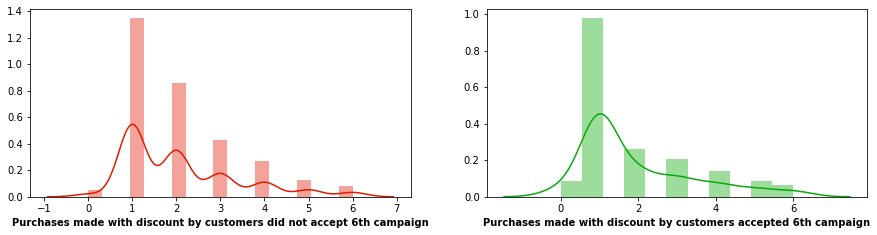

In [139]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumDealsPurchases'],kde=True, color = '#E11901')
plt.xlabel('Purchases made with discount by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumDealsPurchases'],kde=True, color = '#08AA09')
plt.xlabel('Purchases made with discount by customers accepted 6th campaign', fontweight="bold")
plt.show()


fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumDealsPurchases'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumDealsPurchases'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Purchases made with discount by customers', height=500)
fig.show()

Median of Purchases made with discount by customers accepted the 6th campaign is lower than Median of Purchases made with discount by customers didn't accept it.

Standard deviation of Purchases made with discount by customers accepted the 6th campaign is similar of Standard deviation of Purchases made with discount by customers didn't accept it.

Look at skewness. The histogram of Purchases made with discount by customers accepted the 6th campaign has positive skew.

##### Analysing 'NumWebPurchases':

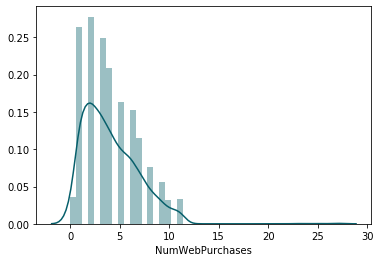

In [140]:
sns.distplot(df['NumWebPurchases'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['NumWebPurchases'], name='NumWebPurchases', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Number of purchases made on company website', width=500, height=500)
fig.show()

In [141]:
print('Number of customers made web purchases more than upper fence: ', df[df['NumWebPurchases']>11]['NumWebPurchases'].count(), '\n' 'But I will not drop them now.')

Number of customers made web purchases more than upper fence:  4 
But I will not drop them now.


Plotting Histogram and Boxplot for 'NumWebPurchases' from two clusters (accepted and don't accepted 6th campaign):

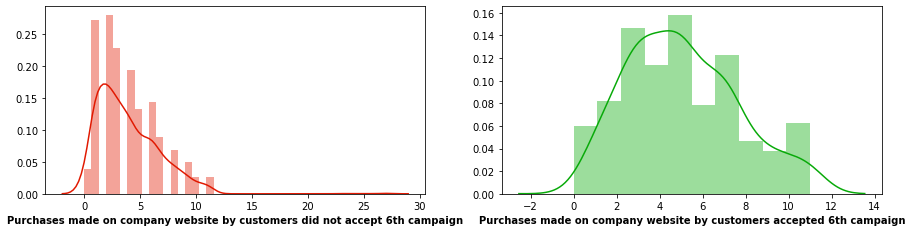

In [142]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumWebPurchases'],kde=True, color = '#E11901')
plt.xlabel('Purchases made on company website by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumWebPurchases'],kde=True, color = '#08AA09')
plt.xlabel('Purchases made on company website by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [143]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumWebPurchases'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumWebPurchases'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Purchases made on company website by customers', height=500)
fig.show()

NumWebPurchases from customers accepted the 6th campaign:

In [144]:
df[df['Response']==1]['NumWebPurchases'].describe()

count    334.000000
mean       5.071856
std        2.558784
min        0.000000
25%        3.000000
50%        5.000000
75%        7.000000
max       11.000000
Name: NumWebPurchases, dtype: float64

NumWebPurchases from customers didn't accept the 6th campaign:

In [145]:
df[df['Response']==0]['NumWebPurchases'].describe()

count    1905.000000
mean        3.912336
std         2.780896
min         0.000000
25%         2.000000
50%         3.000000
75%         6.000000
max        27.000000
Name: NumWebPurchases, dtype: float64

In [146]:
Q1 = df[df['Response']==0]['NumWebPurchases'].quantile(0.25)
Q3 = df[df['Response']==0]['NumWebPurchases'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['NumWebPurchases'] > upper_fence)]['NumWebPurchases'].count(), 'outliers of Purchases made on company website by customers did not accept the 6th campaign.')

Upper Fence = 12.0
There are 4 outliers of Purchases made on company website by customers did not accept the 6th campaign.


In [147]:
df[(df['Response']==0) & (df['NumWebPurchases']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
27,Graduation,Single,51381.5,1,0,19,5.0,1.0,3.0,3.0,7.0,21.0,0.0,27,0,0,1,0,0,0,0,0,0,0,34.0,92
1806,PhD,Single,7144.0,0,2,92,81.0,4.0,33.0,5.0,2.0,21.0,0.0,23,1,1,0,0,0,0,0,0,0,0,54.0,83
1898,PhD,Single,50523.0,0,0,9,6.0,2.0,3.0,1.0,7.0,3.0,0.0,27,0,0,1,0,0,0,0,0,0,0,75.0,77
1975,Graduation,Married,4428.0,0,1,0,16.0,4.0,12.0,2.0,4.0,21.0,0.0,25,0,0,1,0,0,0,0,0,0,0,51.0,85


Replacing outliers of Purchases made on company website by customers didn't accept the 6th campaign by the median:

In [148]:
df['NumWebPurchases'] = np.where((df['Response']==0) & (df['NumWebPurchases']>upper_fence), df[df['Response']==0]['NumWebPurchases'].median(), df['NumWebPurchases'])

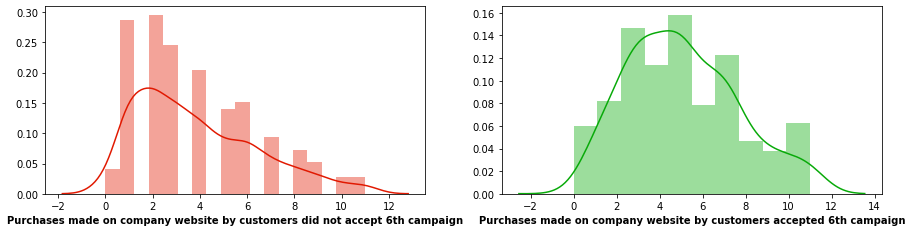

In [149]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumWebPurchases'],kde=True, color = '#E11901')
plt.xlabel('Purchases made on company website by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumWebPurchases'],kde=True, color = '#08AA09')
plt.xlabel('Purchases made on company website by customers accepted 6th campaign', fontweight="bold")
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumWebPurchases'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumWebPurchases'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Purchases made on company website by customers', height=500)
fig.show()

Median of Purchases made on company website by customers accepted the 6th campaign is bigger than Median of Purchases made on company website by customers didn't accept it.

Standard deviation of Purchases made on company website by customers accepted the 6th campaign is similar to Standard deviation of Purchases made on company website by customers didn't accept it.

Look at skewness. The histogram of Purchases made on company website by customers that accepted the 6th campaign has looks like a regular Gaussian Distribution.

##### Analysing 'NumCatalogPurchases':¶

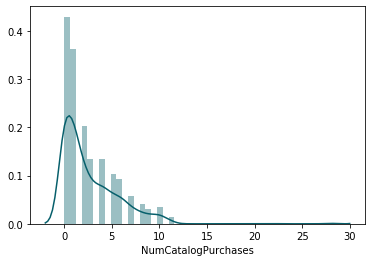

In [150]:
sns.distplot(df['NumCatalogPurchases'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['NumCatalogPurchases'], name='NumCatalogPurchases', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Number of purchases made using catalogue', width=500, height=500)
fig.show()

In [151]:
print('Number of customers on Catalog Purchases more than upper fence: ', df[df['NumCatalogPurchases']>10]['NumCatalogPurchases'].count(), '\n' 'But I will not drop them.')

Number of customers on Catalog Purchases more than upper fence:  23 
But I will not drop them.


Plotting Histogram and Boxplot for 'NumCatalogPurchases' from two clusters (accepted and don't accepted 6th campaign):

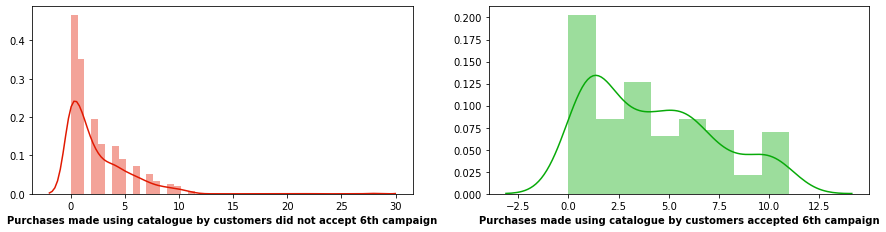

In [152]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumCatalogPurchases'],kde=True, color = '#E11901')
plt.xlabel('Purchases made using catalogue by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumCatalogPurchases'],kde=True, color = '#08AA09')
plt.xlabel('Purchases made using catalogue by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [153]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumCatalogPurchases'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumCatalogPurchases'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Purchases made using catalogue by customers', height=500)
fig.show()

NumCatalogPurchases from customers accepted the 6th campaign:

In [154]:
df[df['Response']==1]['NumCatalogPurchases'].describe()

count    334.000000
mean       4.203593
std        3.131817
min        0.000000
25%        1.000000
50%        4.000000
75%        6.000000
max       11.000000
Name: NumCatalogPurchases, dtype: float64

NumCatalogPurchases from customers didn't accept the 6th campaign:

In [155]:
df[df['Response']==0]['NumCatalogPurchases'].describe()

count    1905.000000
mean        2.392651
std         2.800275
min         0.000000
25%         0.000000
50%         1.000000
75%         4.000000
max        28.000000
Name: NumCatalogPurchases, dtype: float64

In [156]:
Q1 = df[df['Response']==0]['NumCatalogPurchases'].quantile(0.25)
Q3 = df[df['Response']==0]['NumCatalogPurchases'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['NumCatalogPurchases'] > upper_fence)]['NumCatalogPurchases'].count(), 'outliers of Purchases made using catalogue by customers did not accept the 6th campaign.')

Upper Fence = 10.0
There are 14 outliers of Purchases made using catalogue by customers did not accept the 6th campaign.


In [157]:
df[(df['Response']==0) & (df['NumCatalogPurchases']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
21,Graduation,Married,2447.0,1,0,42,1.0,1.0,56.0,1.0,1.0,1.0,2.0,0.0,28,0,1,0,0,0,0,0,0,0,41.0,94
164,PhD,Married,50523.0,0,1,98,20.0,2.0,56.0,1.0,2.0,1.0,2.0,0.0,22,0,0,0,0,0,0,0,0,0,47.0,80
288,Graduation,Widow,79946.0,0,0,19,395.0,7.0,56.0,11.0,7.0,28.0,1.0,5.0,11,5,3,0,0,0,0,0,0,0,54.0,77
636,Graduation,Single,84574.0,0,0,72,387.0,20.0,56.0,38.0,54.0,21.0,1.0,9.0,11,11,5,0,0,0,0,0,0,0,68.0,89
687,PhD,Married,50523.0,0,0,21,55.0,16.0,56.0,17.0,3.0,4.0,2.0,0.0,28,1,0,0,0,0,0,0,0,0,38.0,99
764,Graduation,Single,75127.0,0,0,92,203.0,35.0,305.0,46.0,17.0,21.0,1.0,2.0,11,5,1,0,0,0,0,0,0,0,68.0,77
777,PhD,Together,74250.0,0,0,90,680.0,11.0,392.0,75.0,0.0,0.0,1.0,2.0,11,4,1,0,0,0,0,0,0,0,62.0,81
934,Graduation,Single,75127.0,0,0,92,203.0,35.0,305.0,46.0,17.0,21.0,1.0,2.0,11,5,1,0,0,0,0,0,0,0,68.0,77
1212,Graduation,Together,77044.0,0,1,12,625.0,38.0,242.0,50.0,34.0,76.0,2.0,7.0,11,11,4,1,0,0,0,0,0,0,48.0,84
1465,Master,Divorced,49476.0,0,1,29,386.0,23.0,95.0,54.0,41.0,21.0,4.0,2.0,11,5,2,0,0,0,0,0,0,0,57.0,88


Replacing outliers of Purchases made using catalogue by customers didn't accept the 6th campaign by the median:

In [158]:
df['NumCatalogPurchases'] = np.where((df['Response']==0) & (df['NumCatalogPurchases']>upper_fence), df[df['Response']==0]['NumCatalogPurchases'].median(), df['NumCatalogPurchases'])

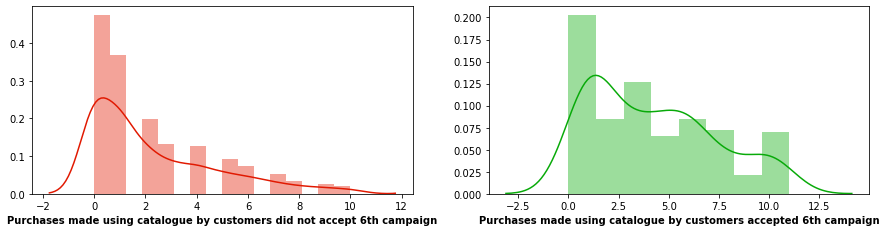

In [159]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumCatalogPurchases'],kde=True, color = '#E11901')
plt.xlabel('Purchases made using catalogue by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumCatalogPurchases'],kde=True, color = '#08AA09')
plt.xlabel('Purchases made using catalogue by customers accepted 6th campaign', fontweight="bold")
plt.show()


fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumCatalogPurchases'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumCatalogPurchases'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Purchases made using catalogue by customers', height=500)
fig.show()

Median of Purchases made using catalogue by customers accepted the 6th campaign is bigger than Median of Purchases made using catalogue by customers didn't accept it.

Standard deviation of Purchases made using catalogue by customers accepted the 6th campaign is bigger than Standard deviation of Purchases made using catalogue by customers didn't accept it.

Look at skewness. The histogram of Purchases made using catalogue by customers that accepted the 6th campaign has positive skew.

##### Analysing 'NumStorePurchases':

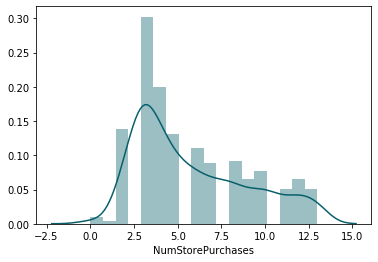

In [160]:
sns.distplot(df['NumStorePurchases'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['NumStorePurchases'], name='NumStorePurchases', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Purchases made directly on stores by customers', width=500, height=500)
fig.show()

In [161]:
print('Purchases made directly on stores by customers more than upper fence: ', df[df['NumStorePurchases']>13]['NumStorePurchases'].count(), '\n' 'It looks great.')

Purchases made directly on stores by customers more than upper fence:  0 
It looks great.


Plotting Histogram and Boxplot for 'NumStorePurchases' from two clusters (accepted and don't accepted 6th campaign):

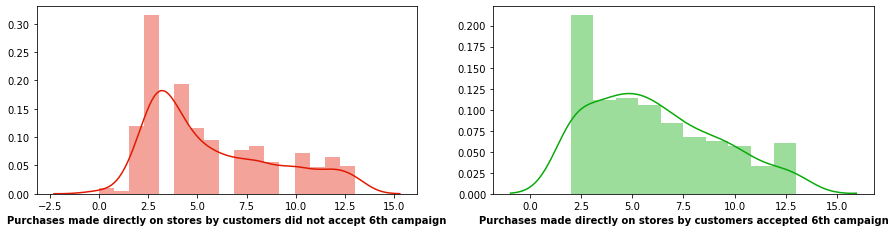

In [162]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumStorePurchases'],kde=True, color = '#E11901')
plt.xlabel('Purchases made directly on stores by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumStorePurchases'],kde=True, color = '#08AA09')
plt.xlabel('Purchases made directly on stores by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [163]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumStorePurchases'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumStorePurchases'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Purchases made directly on stores by customers', height=500)
fig.show()

NumStorePurchases from customers accepted the 6th campaign:

In [164]:
df[df['Response']==1]['NumStorePurchases'].describe()

count    334.000000
mean       6.095808
std        3.081931
min        2.000000
25%        4.000000
50%        6.000000
75%        8.000000
max       13.000000
Name: NumStorePurchases, dtype: float64

NumStorePurchases from customers didn't accept the 6th campaign:

In [165]:
df[df['Response']==0]['NumStorePurchases'].describe()

count    1905.000000
mean        5.738058
std         3.277781
min         0.000000
25%         3.000000
50%         5.000000
75%         8.000000
max        13.000000
Name: NumStorePurchases, dtype: float64

Median of Purchases made directly on stores by customers accepted the 6th campaign is bigger than Median of Purchases made directly on stores by customers didn't accept it.

Standard deviation of Purchases made directly on stores by customers accepted the 6th campaign is similar of Standard deviation of Purchases made directly on stores by customers didn't accept it.

Look at skewness. The histogram of Purchases made directly on stores by customers that accepted the 6th campaign has positive skew.

There aren't any outliers when you look at boxplot of Purchases made directly on stores by customers.

##### Analysing 'NumWebVisitsMonth':

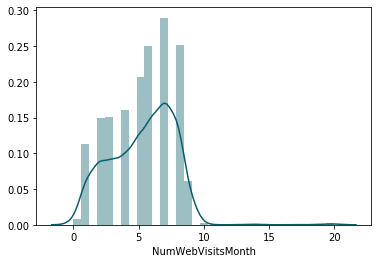

In [166]:
sns.distplot(df['NumWebVisitsMonth'],kde=True, color = '#065F6B')
plt.show()

fig = go.Figure()
fig.add_trace(go.Box(y=df['NumWebVisitsMonth'], name='NumWebVisitsMonth', marker_color = '#065F6B', line_color = '#065F6B'))
fig.update_layout(yaxis_title='Visits on Web Site last month by customers', width=500, height=500)
fig.show()

In [167]:
print('Number of visits on Web Site last month more than upper fence: ', df[df['NumWebVisitsMonth']>13]['NumWebVisitsMonth'].count(), '\n' 'It sounds great.')

Number of visits on Web Site last month more than upper fence:  8 
It sounds great.


Plotting Histogram and Boxplot for 'NumWebVisitsMonth' from two clusters (accepted and don't accepted 6th campaign):

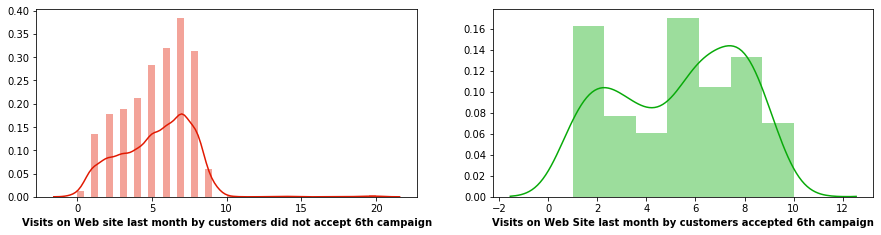

In [168]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumWebVisitsMonth'],kde=True, color = '#E11901')
plt.xlabel('Visits on Web site last month by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumWebVisitsMonth'],kde=True, color = '#08AA09')
plt.xlabel('Visits on Web Site last month by customers accepted 6th campaign', fontweight="bold")

plt.show()

In [169]:
fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumWebVisitsMonth'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumWebVisitsMonth'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Visits on Web Site last month by customers', height=500)
fig.show()

NumWebVisitsMonth from customers accepted the 6th campaign:

In [170]:
df[df['Response']==1]['NumWebVisitsMonth'].describe()

count    334.000000
mean       5.293413
std        2.569891
min        1.000000
25%        3.000000
50%        6.000000
75%        8.000000
max       10.000000
Name: NumWebVisitsMonth, dtype: float64

NumWebVisitsMonth from customers didn't accept the 6th campaign:

In [171]:
df[df['Response']==0]['NumWebVisitsMonth'].describe()

count    1905.000000
mean        5.320210
std         2.401928
min         0.000000
25%         4.000000
50%         6.000000
75%         7.000000
max        20.000000
Name: NumWebVisitsMonth, dtype: float64

In [172]:
Q1 = df[df['Response']==0]['NumWebVisitsMonth'].quantile(0.25)
Q3 = df[df['Response']==0]['NumWebVisitsMonth'].quantile(0.75)
upper_fence = Q3 + (1.5 * (Q3-Q1))

print('Upper Fence =', upper_fence)
print('There are', df[(df['Response']==0) & (df['NumWebVisitsMonth'] > upper_fence)]['NumWebVisitsMonth'].count(), 'outliers of Visits on Web Site last month by customers did not accept the 6th campaign.')

Upper Fence = 11.5
There are 9 outliers of Visits on Web Site last month by customers did not accept the 6th campaign.


In [173]:
df[(df['Response']==0) & (df['NumWebVisitsMonth']>upper_fence)]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
9,PhD,Together,5648.0,1,1,68,28.0,0.0,6.0,1.0,1.0,13.0,1.0,1.0,0.0,0,20,1,0,0,0,0,0,0,70.0,79
774,PhD,Together,6835.0,0,1,76,107.0,2.0,12.0,2.0,2.0,12.0,0.0,0.0,0.0,1,20,0,0,0,0,0,0,0,63.0,95
981,Graduation,Divorced,4861.0,0,0,20,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0,14,0,0,0,0,0,0,0,55.0,76
1042,Graduation,Single,8028.0,0,0,62,73.0,18.0,66.0,7.0,12.0,2.0,2.0,0.0,1.0,0,19,0,0,0,0,0,0,0,29.0,97
1245,Graduation,Divorced,1730.0,0,0,65,1.0,1.0,3.0,1.0,1.0,1.0,2.0,0.0,0.0,0,20,0,0,0,0,0,0,0,49.0,77
1328,Master,Single,6560.0,0,0,2,67.0,11.0,26.0,4.0,3.0,21.0,0.0,1.0,0.0,1,17,0,0,0,0,0,0,0,38.0,82
1524,Graduation,Single,3502.0,1,0,56,2.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0,14,0,0,0,0,0,0,0,47.0,90
1846,PhD,Married,4023.0,1,1,29,5.0,0.0,1.0,1.0,1.0,1.0,2.0,0.0,0.0,0,19,0,0,0,0,0,0,0,57.0,76
2214,Graduation,Married,5305.0,0,1,12,12.0,4.0,7.0,1.0,3.0,5.0,0.0,1.0,0.0,0,13,0,0,0,0,0,0,0,44.0,87


Replacing outliers of Visits on Web Site last month by customers didn't accept the 6th campaign by the median:

In [174]:
df['NumWebVisitsMonth'] = np.where((df['Response']==0) & (df['NumWebVisitsMonth']>upper_fence), df[df['Response']==0]['NumWebVisitsMonth'].median(), df['NumWebVisitsMonth'])

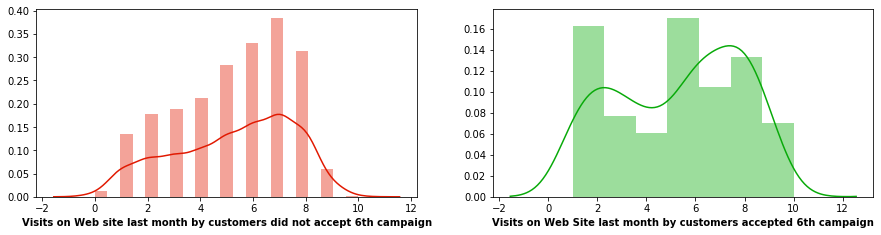

In [175]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.distplot(df[df['Response']==0]['NumWebVisitsMonth'],kde=True, color = '#E11901')
plt.xlabel('Visits on Web site last month by customers did not accept 6th campaign', fontweight="bold")   
    
plt.subplot(5,2,2)
sns.distplot(df[df['Response']==1]['NumWebVisitsMonth'],kde=True, color = '#08AA09')
plt.xlabel('Visits on Web Site last month by customers accepted 6th campaign', fontweight="bold")
plt.show()


fig = go.Figure()
fig.add_trace(go.Box(y=df[df['Response']==0]['NumWebVisitsMonth'], x=df[df['Response']==0]['Response'], name='Do not accepted 6th campaign', marker_color = '#E11901', line_color = '#E11901'))
fig.add_trace(go.Box(y=df[df['Response']==1]['NumWebVisitsMonth'], x=df[df['Response']==1]['Response'], name='Accepted 6th campaign', marker_color = '#08AA09', line_color = '#08AA09'))
fig.update_layout(yaxis_title='Visits on Web Site last month by customers', height=500)
fig.show()

Median of Visits on Web Site last month by customers accepted the 6th campaign and Median of Visits on Web Site last month by customers didn't accept are the same.

Standard deviation of Visits on Web Site last month by customers accepted the 6th campaign is bigger than Standard deviation of Purchases made directly on stores by customers didn't accept it.

##### Analyzing Education and Marital_Status:

In [176]:
df.groupby(['Education']).agg({'Education': np.size}).T

Education,2n Cycle,Basic,Graduation,Master,PhD
Education,203,54,1126,370,486


In [177]:
df.groupby(['Marital_Status']).agg({'Marital_Status': np.size}).T

Marital_Status,Absurd,Alone,Divorced,Married,Single,Together,Widow,YOLO
Marital_Status,2,3,232,864,480,579,77,2


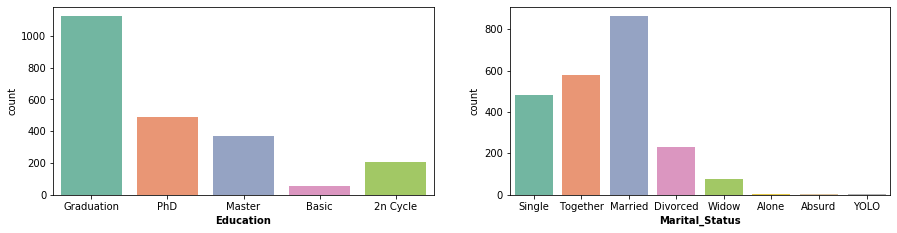

In [178]:
col_categorical = list(df.select_dtypes(include="object"))

plt.figure(figsize=(15,20))
for i,col in enumerate(col_categorical[:], start=1):
    plt.subplot(5,2,i)
    sns.countplot(df[col], palette='Set2')
    plt.xlabel(col, fontweight="bold")
plt.show()

In [179]:
df.groupby(['Response', 'Education']).agg({'Education': np.size}).T

Response         0                                     1                   \
Education 2n Cycle Basic Graduation Master  PhD 2n Cycle Basic Graduation   
Education      181    52        974    313  385       22     2        152   

Response               
Education Master  PhD  
Education     57  101

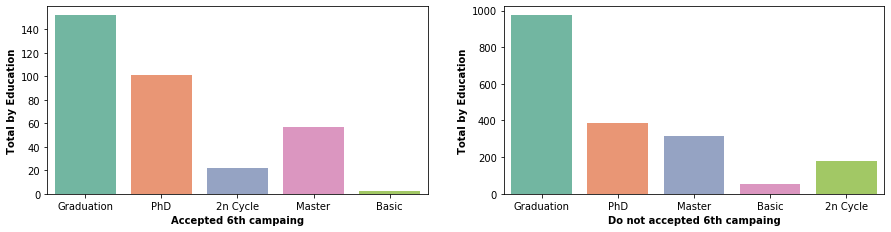

In [180]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.countplot(df[df['Response']==1]['Education'], palette='Set2')
plt.xlabel('Accepted 6th campaing', fontweight="bold")
plt.ylabel('Total by Education', fontweight="bold")  
    
plt.subplot(5,2,2)
sns.countplot(df[df['Response']==0]['Education'], palette='Set2')
plt.xlabel('Do not accepted 6th campaing', fontweight="bold")   
plt.ylabel('Total by Education', fontweight="bold")  

plt.show()

In [181]:
df.groupby(['Response', 'Marital_Status']).agg({'Marital_Status': np.size}).T

Response            0                                                    \
Marital_Status Absurd Alone Divorced Married Single Together Widow YOLO   
Marital_Status      1     2      184     766    374      519    58    1   

Response            1                                                    
Marital_Status Absurd Alone Divorced Married Single Together Widow YOLO  
Marital_Status      1     1       48      98    106       60    19    1

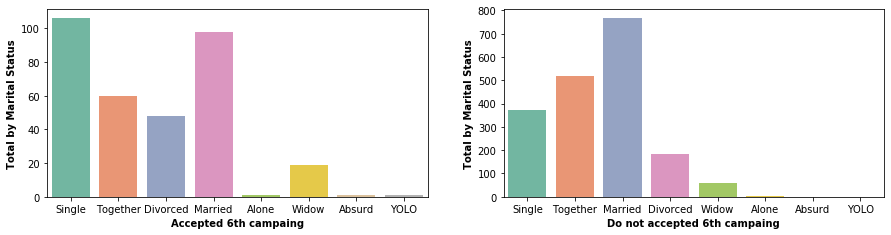

In [182]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.countplot(df[df['Response']==1]['Marital_Status'], palette='Set2')
plt.xlabel('Accepted 6th campaing', fontweight="bold")
plt.ylabel('Total by Marital Status', fontweight="bold")   

plt.subplot(5,2,2)
sns.countplot(df[df['Response']==0]['Marital_Status'], palette='Set2')
plt.xlabel('Do not accepted 6th campaing', fontweight="bold")
plt.ylabel('Total by Marital Status', fontweight="bold") 
    
plt.show()

Look at marital status. Alone, Absurd and YOLO will transform in Single.

In [183]:
df['Marital_Status'] = df['Marital_Status'].replace({'Alone':'Single', 'Absurd':'Single', 'YOLO':'Single'})

In [184]:
df.groupby(['Response', 'Marital_Status']).agg({'Marital_Status': np.size}).T

Response              0                                      1                 \
Marital_Status Divorced Married Single Together Widow Divorced Married Single   
Marital_Status      184     766    378      519    58       48      98    109   

Response                       
Marital_Status Together Widow  
Marital_Status       60    19

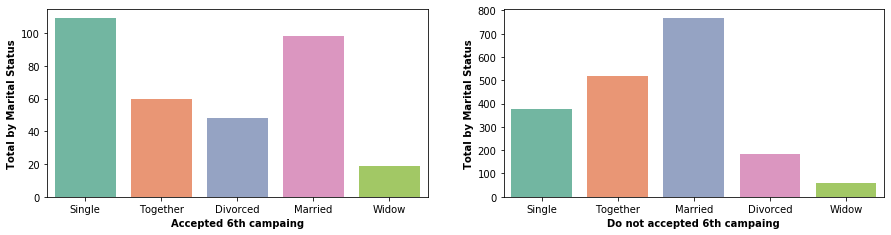

In [185]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.countplot(df[df['Response']==1]['Marital_Status'], palette='Set2')
plt.xlabel('Accepted 6th campaing', fontweight="bold")
plt.ylabel('Total by Marital Status', fontweight="bold")   

plt.subplot(5,2,2)
sns.countplot(df[df['Response']==0]['Marital_Status'], palette='Set2')
plt.xlabel('Do not accepted 6th campaing', fontweight="bold")
plt.ylabel('Total by Marital Status', fontweight="bold") 
    
plt.show()

##### Analyzing Complain:

In [186]:
df.groupby(['Complain']).agg({'Complain': np.size}).T

Complain,0,1
Complain,2218,21


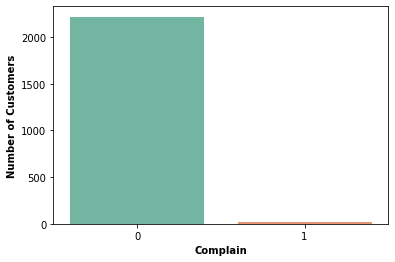

In [187]:
sns.countplot(df['Complain'], palette='Set2')
plt.xlabel('Complain', fontweight="bold")
plt.ylabel('Number of Customers', fontweight="bold")
plt.show()

In [188]:
df.groupby(['Response', 'Complain']).agg({'Complain': np.size}).T

Response     0        1   
Complain     0   1    0  1
Complain  1887  18  331  3

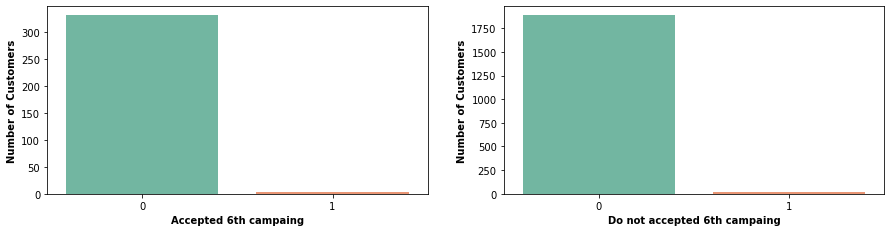

In [189]:
plt.figure(figsize=(15,20))
    
plt.subplot(5,2,1)
sns.countplot(df[df['Response']==1]['Complain'], palette='Set2')
plt.xlabel('Accepted 6th campaing', fontweight="bold")
plt.ylabel('Number of Customers', fontweight="bold")
    
plt.subplot(5,2,2)
sns.countplot(df[df['Response']==0]['Complain'], palette='Set2')
plt.xlabel('Do not accepted 6th campaing', fontweight="bold")
plt.ylabel('Number of Customers', fontweight="bold")
    
plt.show()

##### Analysing 'Kidhome' and 'Teenhome':

In [190]:
df.groupby(['Kidhome']).agg({'Kidhome': np.size}).T

Kidhome,0,1,2
Kidhome,1293,898,48


In [191]:
df.groupby(['Teenhome']).agg({'Teenhome': np.size}).T

Teenhome,0,1,2
Teenhome,1157,1030,52


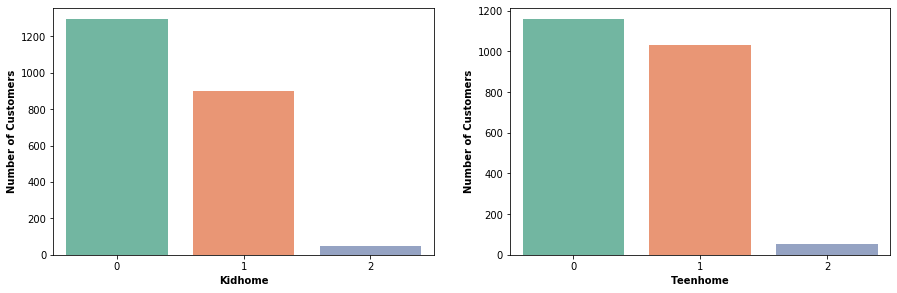

In [192]:
list_kids = ['Kidhome', 'Teenhome']

plt.figure(figsize=(15,10))
for i,col in enumerate(list_kids[:], start=1):
    plt.subplot(2,2,i)
    sns.countplot(df[col], palette='Set2')
    plt.xlabel(col, fontweight="bold")
    plt.ylabel('Number of Customers', fontweight="bold")
plt.show()

In [193]:
list_kids = ['Kidhome', 'Teenhome']

for i,col in enumerate(list_kids[:], start=1):
    fig = px.box(df, x=df[col], y='Age', color=df[col], color_discrete_sequence=['rgb(102,194,165)', 'rgb(252,141,98)', 'rgb(141,160,203)'], width= 700, height=400)
    fig.show()

##### Transforming categorical features into dummy variable

In [194]:
ohe = OneHotEncoder(use_cat_names=True)

df_pre = ohe.fit_transform(df)

df_pre

,Education_Graduation,Education_PhD,Education_Master,Education_Basic,Education_2n Cycle,Marital_Status_Single,Marital_Status_Together,Marital_Status_Married,Marital_Status_Divorced,Marital_Status_Widow,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Member_Months
0,1,0,0,0,0,1,0,0,0,0,58138.0,0,0,58,635.0,88.0,546.0,172.0,88.0,88.0,3.0,8.0,10.0,4,7.0,0,0,0,0,0,0,1,63.0,98
1,1,0,0,0,0,1,0,0,0,0,46344.0,1,1,38,11.0,1.0,6.0,2.0,1.0,6.0,2.0,1.0,1.0,2,5.0,0,0,0,0,0,0,0,66.0,80
2,1,0,0,0,0,0,1,0,0,0,71613.0,0,0,26,426.0,49.0,127.0,11.0,21.0,42.0,1.0,8.0,2.0,10,4.0,0,0,0,0,0,0,0,55.0,86
3,1,0,0,0,0,0,1,0,0,0,26646.0,1,0,26,11.0,4.0,20.0,10.0,3.0,5.0,2.0,2.0,0.0,4,6.0,0,0,0,0,0,0,0,36.0,80
4,0,1,0,0,0,0,0,1,0,0,58293.0,1,0,94,173.0,43.0,118.0,46.0,27.0,15.0,5.0,5.0,3.0,6,5.0,0,0,0,0,0,0,0,39.0,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1,0,0,0,0,0,0,1,0,0,61223.0,0,1,46,709.0,43.0,182.0,42.0,7.0,21.0,2.0,9.0,3.0,4,5.0,0,0,0,0,0,0,0,53.0,88
2236,0,1,0,0,0,0,1,0,0,0,64014.0,2,1,56,406.0,0.0,30.0,0.0,0.0,8.0,2.0,8.0,2.0,5,7.0,0,0,0,1,0,0,0,74.0,76
2237,1,0,0,0,0,0,0,0,1,0,56981.0,0,0,91,908.0,48.0,217.0,32.0,12.0,24.0,1.0,2.0,3.0,13,6.0,0,1,0,0,0,0,0,39.0,81
2238,0,0,1,0,0,0,1,0,0,0,69245.0,0,1,8,428.0,30.0,214.0,80.0,30.0,61.0,2.0,6.0,5.0,10,3.0,0,0,0,0,0,0,0,64.0,81


In [195]:
df_pre.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2239 entries, 0 to 2239
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Education_Graduation     2239 non-null   int64  
 1   Education_PhD            2239 non-null   int64  
 2   Education_Master         2239 non-null   int64  
 3   Education_Basic          2239 non-null   int64  
 4   Education_2n Cycle       2239 non-null   int64  
 5   Marital_Status_Single    2239 non-null   int64  
 6   Marital_Status_Together  2239 non-null   int64  
 7   Marital_Status_Married   2239 non-null   int64  
 8   Marital_Status_Divorced  2239 non-null   int64  
 9   Marital_Status_Widow     2239 non-null   int64  
 10  Income                   2239 non-null   float64
 11  Kidhome                  2239 non-null   int64  
 12  Teenhome                 2239 non-null   int64  
 13  Recency                  2239 non-null   int64  
 14  MntWines                

##### Correlation Matrix:

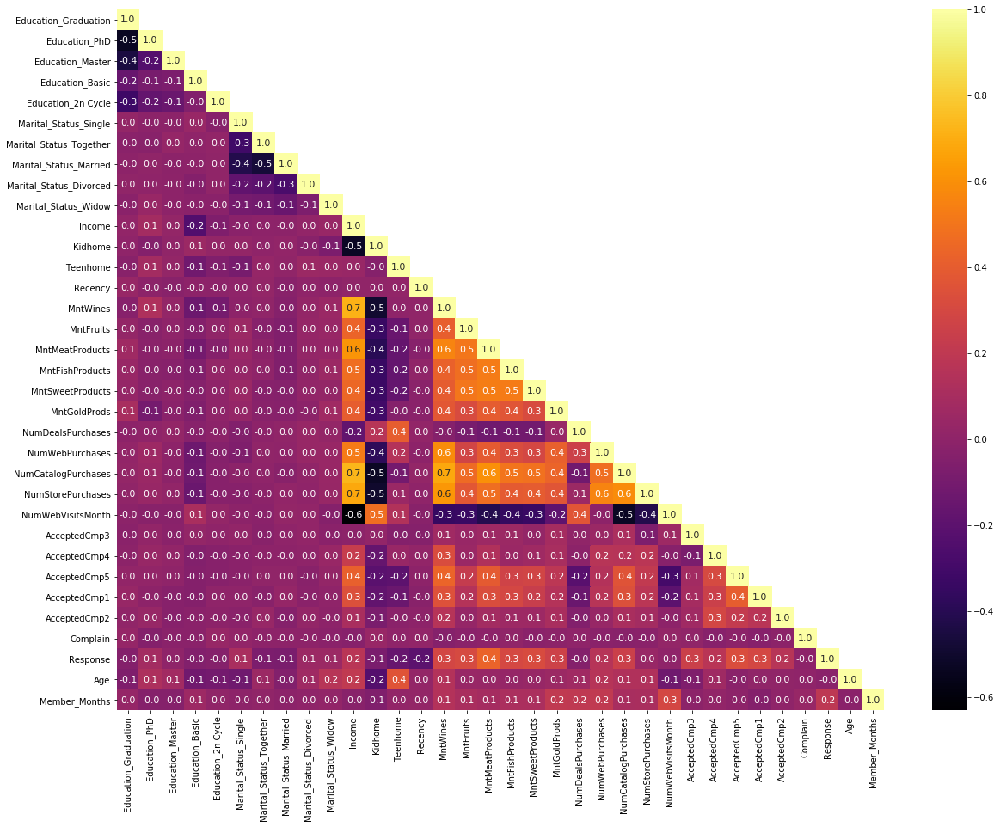

In [196]:
plt.figure(figsize=(20,15))
sns.heatmap(df_pre.corr(),annot=True, annot_kws={'size': 11}, cmap='inferno',mask=np.triu(df_pre.corr(),k=1), fmt=".1f")
plt.savefig('correl.png', format='png')
plt.show()

##### Explanatory and Response features:

In [197]:
x_classif = df_pre.drop(['Response'], axis=1)
y_classif = df_pre['Response']

In [198]:
x_classif

,Education_Graduation,Education_PhD,Education_Master,Education_Basic,Education_2n Cycle,Marital_Status_Single,Marital_Status_Together,Marital_Status_Married,Marital_Status_Divorced,Marital_Status_Widow,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Age,Member_Months
0,1,0,0,0,0,1,0,0,0,0,58138.0,0,0,58,635.0,88.0,546.0,172.0,88.0,88.0,3.0,8.0,10.0,4,7.0,0,0,0,0,0,0,63.0,98
1,1,0,0,0,0,1,0,0,0,0,46344.0,1,1,38,11.0,1.0,6.0,2.0,1.0,6.0,2.0,1.0,1.0,2,5.0,0,0,0,0,0,0,66.0,80
2,1,0,0,0,0,0,1,0,0,0,71613.0,0,0,26,426.0,49.0,127.0,11.0,21.0,42.0,1.0,8.0,2.0,10,4.0,0,0,0,0,0,0,55.0,86
3,1,0,0,0,0,0,1,0,0,0,26646.0,1,0,26,11.0,4.0,20.0,10.0,3.0,5.0,2.0,2.0,0.0,4,6.0,0,0,0,0,0,0,36.0,80
4,0,1,0,0,0,0,0,1,0,0,58293.0,1,0,94,173.0,43.0,118.0,46.0,27.0,15.0,5.0,5.0,3.0,6,5.0,0,0,0,0,0,0,39.0,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1,0,0,0,0,0,0,1,0,0,61223.0,0,1,46,709.0,43.0,182.0,42.0,7.0,21.0,2.0,9.0,3.0,4,5.0,0,0,0,0,0,0,53.0,88
2236,0,1,0,0,0,0,1,0,0,0,64014.0,2,1,56,406.0,0.0,30.0,0.0,0.0,8.0,2.0,8.0,2.0,5,7.0,0,0,0,1,0,0,74.0,76
2237,1,0,0,0,0,0,0,0,1,0,56981.0,0,0,91,908.0,48.0,217.0,32.0,12.0,24.0,1.0,2.0,3.0,13,6.0,0,1,0,0,0,0,39.0,81
2238,0,0,1,0,0,0,1,0,0,0,69245.0,0,1,8,428.0,30.0,214.0,80.0,30.0,61.0,2.0,6.0,5.0,10,3.0,0,0,0,0,0,0,64.0,81


In [199]:
y_classif

0       1
1       0
2       0
3       0
4       0
       ..
2235    0
2236    0
2237    0
2238    0
2239    1
Name: Response, Length: 2239, dtype: int64

The dataset is imbalanced:

In [200]:
df_pre['Response'].groupby(df_pre['Response']).count()

Response
0    1905
1     334
Name: Response, dtype: int64

In [201]:
round(df_pre['Response'].groupby(df_pre['Response']).count()/df['Response'].count(),2)

Response
0    0.85
1    0.15
Name: Response, dtype: float64

Let's balance the dataset applying SMOTE:

In [202]:
smt = SMOTE(random_state=0)

In [203]:
x_classif, y_classif = smt.fit_sample(x_classif, y_classif)

In [204]:
x_classif

,Education_Graduation,Education_PhD,Education_Master,Education_Basic,Education_2n Cycle,Marital_Status_Single,Marital_Status_Together,Marital_Status_Married,Marital_Status_Divorced,Marital_Status_Widow,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Age,Member_Months
0,1,0,0,0,0,1,0,0,0,0,58138.000000,0,0,58,635.000000,88.000000,546.000000,172.000000,88.000000,88.000000,3.000000,8.000000,10.000000,4,7.000000,0,0,0,0,0,0,63.000000,98
1,1,0,0,0,0,1,0,0,0,0,46344.000000,1,1,38,11.000000,1.000000,6.000000,2.000000,1.000000,6.000000,2.000000,1.000000,1.000000,2,5.000000,0,0,0,0,0,0,66.000000,80
2,1,0,0,0,0,0,1,0,0,0,71613.000000,0,0,26,426.000000,49.000000,127.000000,11.000000,21.000000,42.000000,1.000000,8.000000,2.000000,10,4.000000,0,0,0,0,0,0,55.000000,86
3,1,0,0,0,0,0,1,0,0,0,26646.000000,1,0,26,11.000000,4.000000,20.000000,10.000000,3.000000,5.000000,2.000000,2.000000,0.000000,4,6.000000,0,0,0,0,0,0,36.000000,80
4,0,1,0,0,0,0,0,1,0,0,58293.000000,1,0,94,173.000000,43.000000,118.000000,46.000000,27.000000,15.000000,5.000000,5.000000,3.000000,6,5.000000,0,0,0,0,0,0,39.000000,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3805,1,0,0,0,0,0,0,0,0,0,81358.302735,0,0,18,167.055789,22.986810,425.747616,27.092327,64.749398,75.788967,1.000000,3.032974,9.967026,12,1.046163,0,0,0,0,0,0,33.118706,80
3806,1,0,0,0,0,0,0,0,0,0,73735.408322,0,0,15,593.003895,40.127191,526.141539,19.096546,23.626217,148.412934,1.000000,3.000000,9.472276,8,1.763862,0,0,0,0,0,0,38.737112,83
3807,0,0,0,0,0,1,0,0,0,0,31779.397833,1,0,42,65.787391,8.046193,22.697111,11.627295,5.650918,38.300782,1.465092,3.325459,0.930184,2,8.465092,1,0,0,0,0,0,40.650918,96
3808,1,0,0,0,0,0,0,0,0,0,45908.508730,1,0,9,291.017944,8.003608,104.527060,17.505412,13.003608,19.830327,1.000000,4.667869,1.833935,8,6.833935,0,0,0,0,0,0,43.003608,85


In [205]:
y_classif

0       1
1       0
2       0
3       0
4       0
       ..
3805    1
3806    1
3807    1
3808    1
3809    1
Name: Response, Length: 3810, dtype: int64

##### Splitting the dataset into the Training set and Test set:

In [206]:
x_train, x_test, y_train, y_test = train_test_split(x_classif, y_classif, test_size = 0.25, random_state = 0)

In [207]:
x_train

,Education_Graduation,Education_PhD,Education_Master,Education_Basic,Education_2n Cycle,Marital_Status_Single,Marital_Status_Together,Marital_Status_Married,Marital_Status_Divorced,Marital_Status_Widow,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Age,Member_Months
1917,0,1,0,0,0,1,0,0,0,0,36038.000000,1,0,82,23.000000,0.000000,15.000000,0.000000,2.000000,7.000000,2.000000,3.000000,0.000000,3,6.000000,0,0,0,0,0,0,39.000000,89
1002,0,0,0,0,1,0,0,1,0,0,56337.000000,1,1,25,349.000000,16.000000,144.000000,28.000000,5.000000,39.500000,5.000000,8.000000,5.000000,4,8.000000,1,0,0,1,0,0,39.000000,91
3520,1,0,0,0,0,0,0,0,0,0,42719.316856,1,1,8,390.990578,4.984706,90.821567,27.857253,25.867450,111.429014,1.020392,6.984706,2.989804,6,8.000000,0,0,0,0,0,0,55.050981,90
1093,0,1,0,0,0,1,0,0,0,0,38578.000000,1,1,2,38.000000,4.000000,22.000000,3.000000,3.000000,3.000000,3.000000,3.000000,0.000000,3,8.000000,0,0,0,0,0,0,48.000000,88
3217,0,1,0,0,0,0,0,0,0,0,61998.079717,0,1,27,1047.669603,12.000000,146.144708,0.148551,0.111413,23.888587,3.018569,6.009284,4.018569,7,5.009284,0,0,0,0,0,0,43.046422,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
835,1,0,0,0,0,0,0,1,0,0,71391.000000,0,1,50,336.000000,7.000000,274.000000,46.000000,7.000000,21.000000,5.000000,6.000000,5.000000,12,3.000000,0,0,0,0,0,0,64.000000,91
3264,0,1,0,0,0,1,0,0,0,0,48319.572264,0,0,43,361.232595,54.529379,165.941103,39.133668,29.935812,41.414439,3.828878,6.414439,2.171122,10,6.243317,0,0,0,0,0,0,49.342245,96
1653,1,0,0,0,0,0,1,0,0,0,50523.000000,0,0,13,1.000000,0.000000,56.000000,2.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0,1.000000,0,0,0,0,0,0,43.000000,90
2607,0,1,0,0,0,0,0,1,0,0,55467.922531,0,1,28,471.917991,32.190598,148.106319,5.277147,30.802592,73.467746,4.472285,8.889141,3.110859,7,7.416856,0,0,0,0,0,0,56.279417,95


In [208]:
y_train

1917    0
1002    1
3520    1
1093    0
3217    1
       ..
835     0
3264    1
1653    0
2607    1
2732    1
Name: Response, Length: 2857, dtype: int64

Now, it sounds great and the dataset is balanced:

In [209]:
y_train.groupby(y_train).count()

Response
0    1419
1    1438
Name: Response, dtype: int64

In [210]:
round(y_train.groupby(y_train).count()/y_train.count(),3)

Response
0    0.497
1    0.503
Name: Response, dtype: float64

In [211]:
y_test.groupby(y_test).count()

Response
0    486
1    467
Name: Response, dtype: int64

In [212]:
round(y_test.groupby(y_test).count()/y_test.count(),3)

Response
0    0.51
1    0.49
Name: Response, dtype: float64

##### Feature Scaling:

In [213]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [214]:
x_train

array([[-0.80593927,  2.21700561, -0.35702445, ..., -0.07962575,
        -1.0378263 ,  0.08238564],
       [-0.80593927, -0.45105885, -0.35702445, ..., -0.07962575,
        -1.0378263 ,  0.39414165],
       [ 1.24078828, -0.45105885, -0.35702445, ..., -0.07962575,
         0.39626918,  0.23826365],
       ...,
       [ 1.24078828, -0.45105885, -0.35702445, ..., -0.07962575,
        -0.68044116,  0.23826365],
       [-0.80593927,  2.21700561, -0.35702445, ..., -0.07962575,
         0.50602539,  1.01765367],
       [-0.80593927, -0.45105885, -0.35702445, ..., -0.07962575,
         1.27042523,  1.48528768]])

In [215]:
x_test

array([[ 1.24078828, -0.45105885, -0.35702445, ..., -0.07962575,
        -1.57390399, -0.54112637],
       [ 1.24078828, -0.45105885, -0.35702445, ..., -0.07962575,
         0.30236794, -1.94402841],
       [ 1.24078828, -0.45105885, -0.35702445, ..., -0.07962575,
         0.41930031,  1.48528768],
       ...,
       [ 1.24078828, -0.45105885, -0.35702445, ..., -0.07962575,
        -0.68044116, -1.6322724 ],
       [-0.80593927, -0.45105885, -0.35702445, ..., -0.07962575,
        -0.61551729,  1.48528768],
       [-0.80593927,  2.21700561, -0.35702445, ..., -0.07962575,
        -0.5017486 ,  1.48528768]])

# Decision Tree Classifier:

Creating the classifer:

In [216]:
classifier_dt = DecisionTreeClassifier(criterion = 'gini', random_state = 0)
classifier_dt.fit(x_train, y_train)

DecisionTreeClassifier(random_state=0)

Predicting:

In [217]:
y_pred = classifier_dt.predict(x_test)

Making the Confusion Matrix:

In [218]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,434,52
True Accepted,32,435


Calculation precision score and recall score:

In [223]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.893
Recall Score: 0.931


Calculating accuracy score:

In [224]:
accuracy = accuracy_score(y_test, y_pred)
print('Decision Tree Classifier accuracy score = {0:.4f}'.format(round(accuracy,4)))

Decision Tree Classifier accuracy score = 0.9119


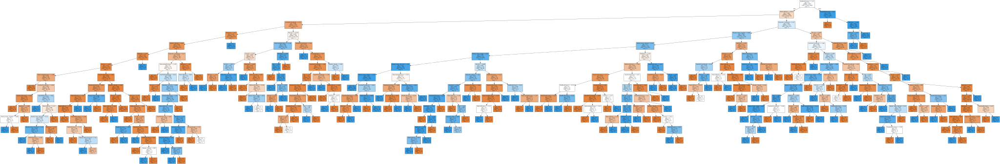

In [225]:
dot_data = tree.export_graphviz(classifier_dt, out_file=None, 
                                feature_names=x_classif.columns,  
                                class_names=y_classif.unique().astype('str'),
                                filled=True)


graph = graphviz.Source(dot_data, format="png") 
graph

In [226]:
graph.render("decision_tree")

'decision_tree.png'

Above, all features were used on this model but as you can see on the tree it's a little fuzzy. 

Now let's try to verify the most important features for Decision Tree Classifier:

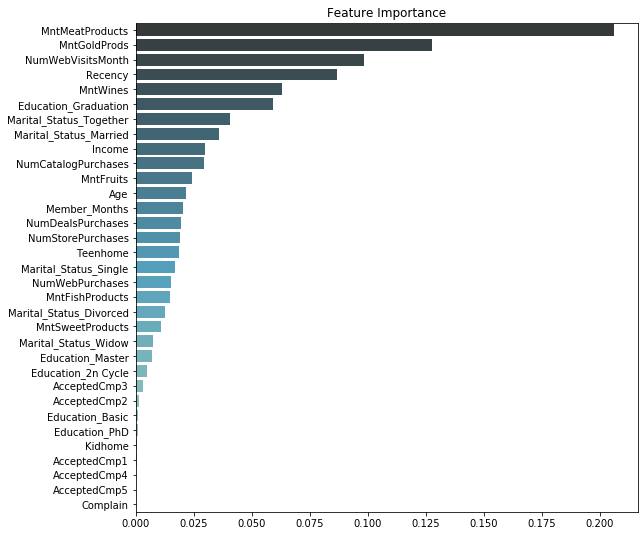

In [227]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_dt.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()

##### Applying max_depth = 6:

In [228]:
classifier_dt = DecisionTreeClassifier(criterion = 'gini', random_state = 0, max_depth=6)
classifier_dt.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=6, random_state=0)

In [229]:
y_pred = classifier_dt.predict(x_test)

In [230]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,422,64
True Accepted,86,381


In [232]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.856
Recall Score: 0.816


In [233]:
accuracy = accuracy_score(y_test, y_pred)
print('Decision Tree Classifier accuracy score = {0:.4f}'.format(round(accuracy,4)))

Decision Tree Classifier accuracy score = 0.8426


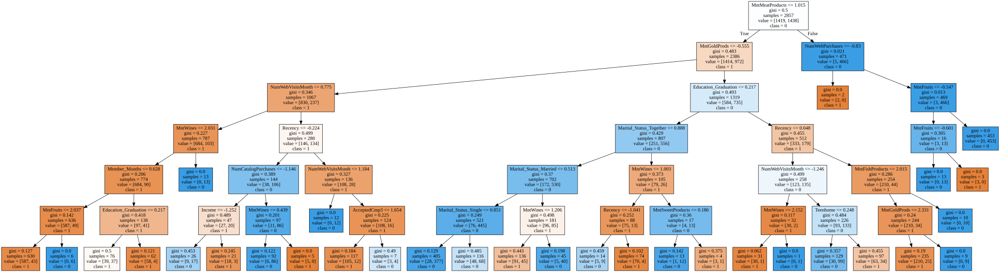

In [234]:
dot_data = tree.export_graphviz(classifier_dt, out_file=None, 
                                feature_names=x_classif.columns,  
                                class_names=y_classif.unique().astype('str'),
                                filled=True)


graph = graphviz.Source(dot_data, format="png") 
graph

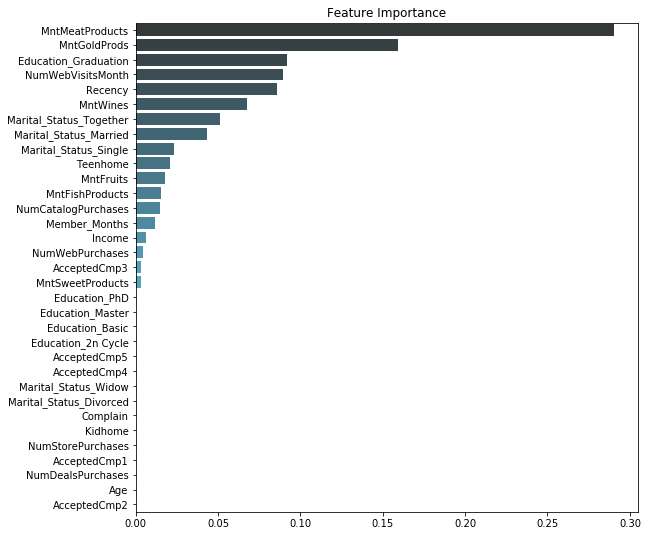

In [235]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_dt.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()

In [236]:
graph.render('decision_tree_max_depth_6')

'decision_tree_max_depth_6.png'

##### Applying max_depth = 7:

In [237]:
classifier_dt = DecisionTreeClassifier(criterion = 'gini', random_state = 0, max_depth=7)
classifier_dt.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=7, random_state=0)

In [238]:
y_pred = classifier_dt.predict(x_test)

In [239]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,429,57
True Accepted,77,390


In [240]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.872
Recall Score: 0.835


In [241]:
accuracy = accuracy_score(y_test, y_pred)
print('Decision Tree Classifier accuracy score = {0:.4f}'.format(round(accuracy,4)))

Decision Tree Classifier accuracy score = 0.8594


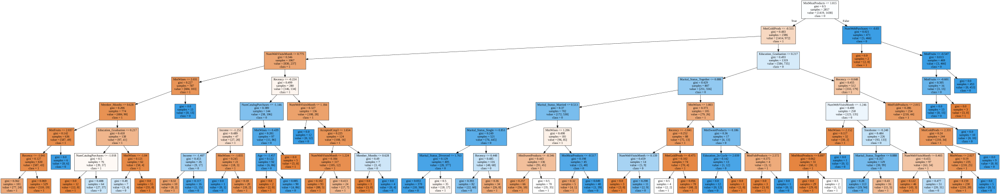

In [242]:
dot_data = tree.export_graphviz(classifier_dt, out_file=None, 
                                feature_names=x_classif.columns,  
                                class_names=y_classif.unique().astype('str'),
                                filled=True)


graph = graphviz.Source(dot_data, format="png") 
graph

In [243]:
graph.render('decision_tree_max_depth_7')

'decision_tree_max_depth_7.png'

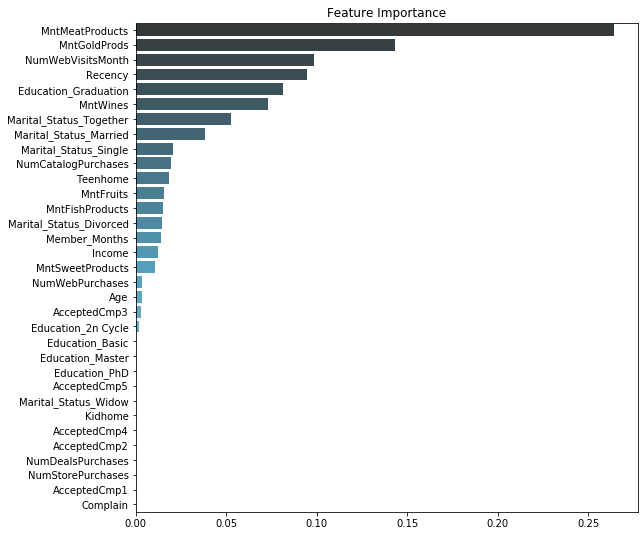

In [244]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_dt.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()

##### Applying max_depth = 8:

In [245]:
classifier_dt = DecisionTreeClassifier(criterion = 'gini', random_state = 0, max_depth=8)
classifier_dt.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=8, random_state=0)

In [246]:
y_pred = classifier_dt.predict(x_test)

In [247]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,422,64
True Accepted,54,413


In [248]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.866
Recall Score: 0.884


In [249]:
accuracy = accuracy_score(y_test, y_pred)
print('Decision Tree Classifier accuracy score = {0:.4f}'.format(round(accuracy,4)))

Decision Tree Classifier accuracy score = 0.8762


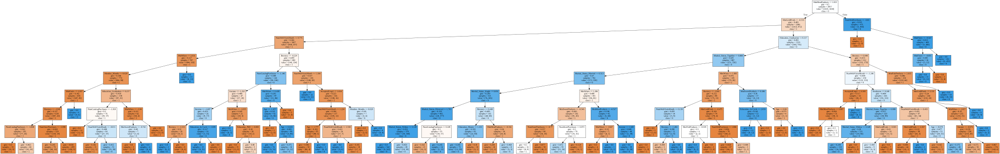

In [250]:
dot_data = tree.export_graphviz(classifier_dt, out_file=None, 
                                feature_names=x_classif.columns,  
                                class_names=y_classif.unique().astype('str'),
                                filled=True)


graph = graphviz.Source(dot_data, format="png") 
graph

In [251]:
graph.render('decision_tree_max_depth_8')

'decision_tree_max_depth_8.png'

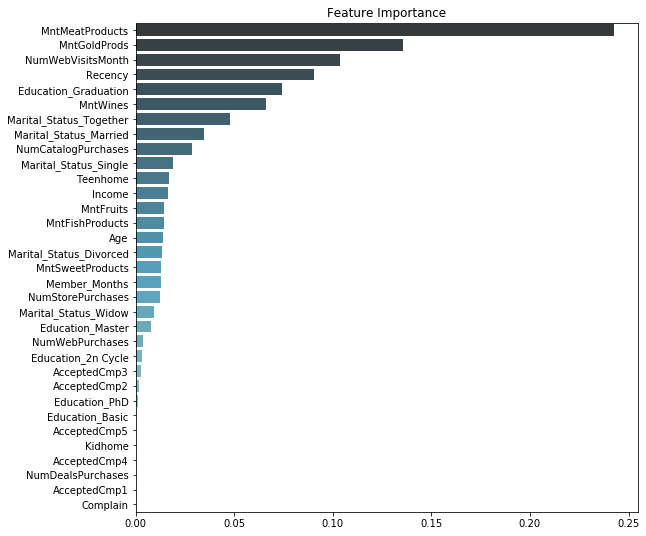

In [252]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_dt.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()

##### Applying max_depth = 9:

In [253]:
classifier_dt = DecisionTreeClassifier(criterion = 'gini', random_state = 0, max_depth=9)
classifier_dt.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=9, random_state=0)

In [254]:
y_pred = classifier_dt.predict(x_test)

In [255]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,426,60
True Accepted,44,423


In [256]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.876
Recall Score: 0.906


In [257]:
accuracy = accuracy_score(y_test, y_pred)
print('Decision Tree Classifier accuracy score = {0:.4f}'.format(round(accuracy,4)))

Decision Tree Classifier accuracy score = 0.8909


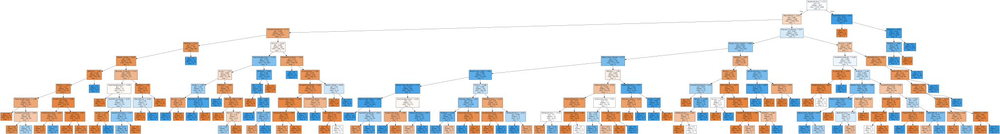

In [258]:
dot_data = tree.export_graphviz(classifier_dt, out_file=None, 
                                feature_names=x_classif.columns,  
                                class_names=y_classif.unique().astype('str'),
                                filled=True)


graph = graphviz.Source(dot_data, format="png") 
graph

In [259]:
graph.render('decision_tree_max_depth_9')

'decision_tree_max_depth_9.png'

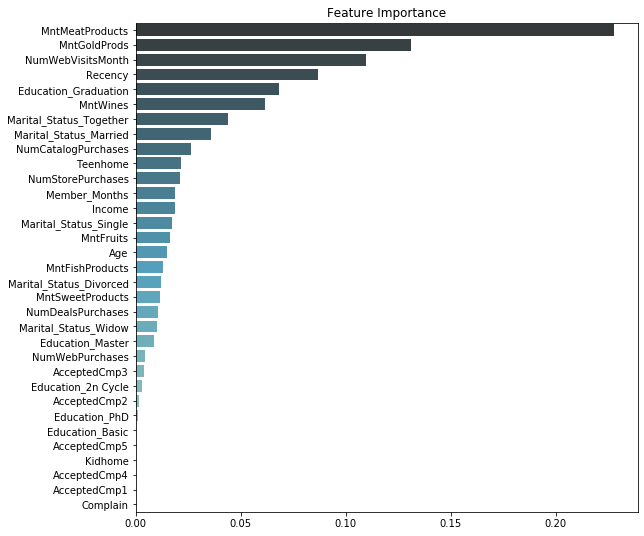

In [260]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_dt.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()

##### Applying max_depth = 10:

In [261]:
classifier_dt = DecisionTreeClassifier(criterion = 'gini', random_state = 0, max_depth=10)
classifier_dt.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=10, random_state=0)

In [262]:
y_pred = classifier_dt.predict(x_test)

In [263]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,430,56
True Accepted,42,425


In [264]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.884
Recall Score: 0.91


In [265]:
accuracy = accuracy_score(y_test, y_pred)
print('Decision Tree Classifier accuracy score = {0:.4f}'.format(round(accuracy,4)))

Decision Tree Classifier accuracy score = 0.8972


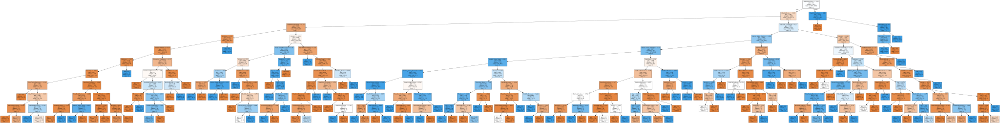

In [266]:
dot_data = tree.export_graphviz(classifier_dt, out_file=None, 
                                feature_names=x_classif.columns,  
                                class_names=y_classif.unique().astype('str'),
                                filled=True)


graph = graphviz.Source(dot_data, format="png") 
graph

In [267]:
graph.render('decision_tree_max_depth_10')

'decision_tree_max_depth_10.png'

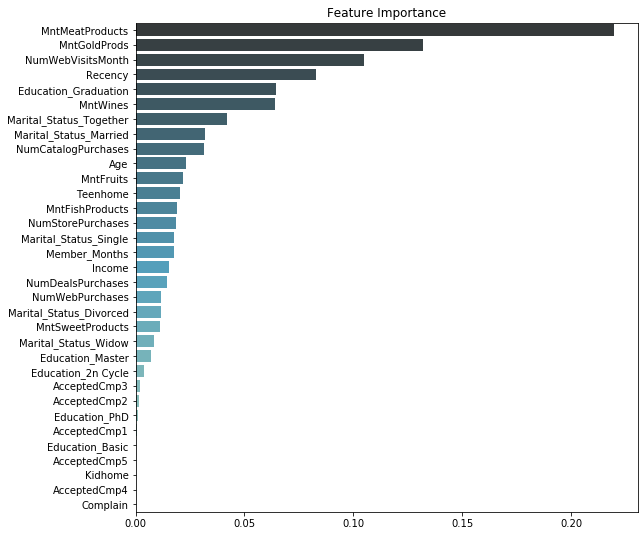

In [268]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_dt.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()

It is very important to try another kind of classifier, so let's do it.

# Support Vector Classification

In [269]:
classifier_svc = SVC(random_state = 0)

Applying Grid Search to find the best the best parameters:

In [270]:
parameters = [{'C' : [1, 10, 100, 1000], 
               'kernel' : ['linear', 'rbf'], 
               'gamma' : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
              }]

grid_search = GridSearchCV(estimator = classifier_svc, 
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           n_jobs = -1)

grid_search = grid_search.fit(x_train, y_train)


best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_

print('Best accuracy =', "{0:.4f}".format(round(best_accuracy,4)))
print('Best parameters =', best_parameters)

Best accuracy = 0.9342
Best parameters = {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


Applying the best parameters:

In [271]:
classifier_svc = SVC(random_state = 0, C=10, kernel = 'rbf', gamma = 0.1)
classifier_svc.fit(x_train, y_train)

SVC(C=10, gamma=0.1, random_state=0)

Predicting the Test set results:

In [272]:
y_pred = classifier_svc.predict(x_test)

Confusion Matrix:

In [273]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,455,31
True Accepted,31,436


In [274]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.934
Recall Score: 0.934


In [275]:
accuracy = accuracy_score(y_test, y_pred)
print('SVC accuracy score = {0:.4f}'.format(round(accuracy,4)))

SVC accuracy score = 0.9349


# Naive Bayes

Creating the classifier and fitting model:

In [276]:
classifier_nb = GaussianNB()
classifier_nb.fit(x_train, y_train)

GaussianNB()

Predicting the Test set results

In [277]:
y_pred = classifier_nb.predict(x_test)

Making the Confusion Matrix:

In [278]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,410,76
True Accepted,141,326


In [279]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.811
Recall Score: 0.698


In [280]:
accuracy = accuracy_score(y_test, y_pred)
print('Naive Bayes accuracy score = {0:.4f}'.format(round(accuracy,4)))

Naive Bayes accuracy score = 0.7723


# Logistic Regression

Creating the classifier:

In [281]:
classifier_lr = LogisticRegression(random_state = 0)

Applying GridSearchCV:

In [282]:
parameters = [{ 'C' : [1, 10, 100, 1000], 
                'solver' : ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga'],
                'penalty': ['l1', 'l2', 'elasticnet']
              }]

grid_search = GridSearchCV(estimator = classifier_lr, 
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           n_jobs = -1)

grid_search = grid_search.fit(x_train, y_train)


best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_


print('Best accuracy =', "{0:.4f}".format(round(best_accuracy,4)),'\n')
print('Best parameters =', best_parameters,'\n')

scores = grid_search.cv_results_['mean_test_score']
for score, solver in zip(scores, ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']):
    print(f"{solver} {score:.3f}" )

Best accuracy = 0.9293 

Best parameters = {'C': 100, 'penalty': 'l1', 'solver': 'saga'} 

liblinear 0.929
newton-cg nan
lbfgs nan
sag nan
saga 0.929


In [283]:
classifier_lr = LogisticRegression(C=10, penalty = 'l1', solver='liblinear', random_state = 0)
classifier_lr.fit(x_train, y_train)

LogisticRegression(C=10, penalty='l1', random_state=0, solver='liblinear')

Predicting the Test set results:

In [284]:
y_pred = classifier_lr.predict(x_test)

Making the Confusion Matrix:

In [285]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,455,31
True Accepted,33,434


In [286]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.933
Recall Score: 0.929


In [287]:
accuracy = accuracy_score(y_test, y_pred)
print('Logistic Regression accuracy score = {0:.4f}'.format(round(accuracy,4)))

Logistic Regression accuracy score = 0.9328


# Random Forest Classifier

Creating the classifer:

In [288]:
classifier_rfc  = RandomForestClassifier(random_state = 0)

Running GridSearchCV and set some hyperparameters:

In [289]:
parameters = [{ 'max_depth' : [6, 7, 8, 9, 10],
                'min_samples_split' : [2, 5, 10, 15, 100],
                'min_samples_leaf' : [1, 2, 5, 10],
                'n_estimators' : [1, 5, 10, 20, 30, 50, 100, 150, 200, 300, 400],
                'criterion' : ['gini', 'entropy'] 
              }]

grid_search = GridSearchCV(estimator = classifier_rfc, 
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           n_jobs = -1)

grid_search = grid_search.fit(x_train, y_train)


best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_


print('Best accuracy =', "{0:.4f}".format(round(best_accuracy,4)),'\n')
print('Best parameters =', best_parameters,'\n')
pprint(grid_search.best_estimator_.get_params())

Best accuracy = 0.9541 

Best parameters = {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150} 

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 10,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 150,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}


Fitting the model:

In [296]:
classifier_rfc  = RandomForestClassifier(random_state = 0, 
                                         criterion = 'gini', 
                                         max_depth = 10, 
                                         min_samples_leaf = 1, 
                                         min_samples_split = 2, 
                                         n_estimators = 150)
classifier_rfc.fit(x_train, y_train)

RandomForestClassifier(max_depth=10, n_estimators=150, random_state=0)

Predicting the Test set results with the best parameters:

In [297]:
y_pred = classifier_rfc.predict(x_test)

Making the Confusion Matrix:

In [298]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,464,22
True Accepted,21,446


In [299]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.953
Recall Score: 0.955


In [300]:
accuracy = accuracy_score(y_test, y_pred)
print('Random Forest Classifier accuracy score = {0:.4f}'.format(round(best_accuracy,4)))

Random Forest Classifier accuracy score = 0.9541


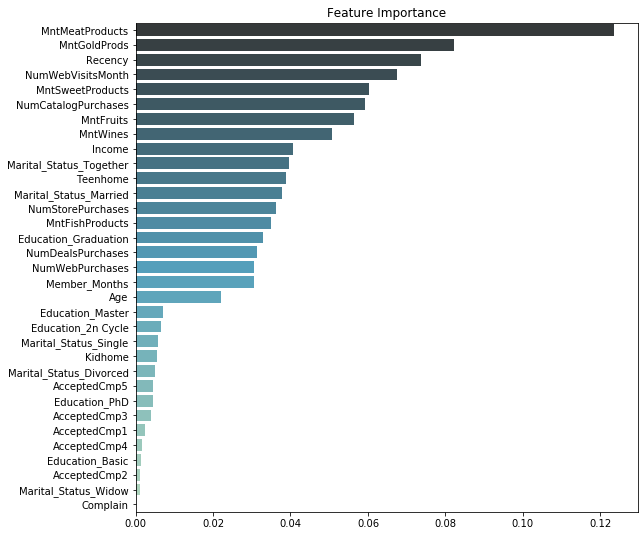

In [301]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_rfc.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()

# XGBoost Classifier

Creating the classifer:

In [302]:
classifier_xgb =  XGBClassifier(random_state = 0)

Running GridSearchCV and set some hyperparameters:

In [303]:
parameters = [{ 'max_depth' : [6, 7, 8, 9, 10],
                'min_child_weight' : range(1, 10, 1),
                'n_estimators' : [1, 5, 10, 20, 30, 50, 100, 150, 200, 300, 400],
                'objective' : ['binary:logistic'],
                'gamma': [i/10.0 for i in range(0,5)]               
              }]

grid_search = GridSearchCV(estimator = classifier_xgb, 
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           n_jobs = -1)

grid_search = grid_search.fit(x_train, y_train)


best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_


print('Best accuracy =', "{0:.4f}".format(round(best_accuracy,4)),'\n')
print('Best parameters =', best_parameters,'\n')
pprint(grid_search.best_estimator_.get_params())

Best accuracy = 0.9576 

Best parameters = {'gamma': 0.0, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'objective': 'binary:logistic'} 

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0.0,
 'gpu_id': -1,
 'importance_type': 'gain',
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_delta_step': 0,
 'max_depth': 7,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 200,
 'n_jobs': 0,
 'num_parallel_tree': 1,
 'objective': 'binary:logistic',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': None}


Fitting the model with best parameters:

In [309]:
classifier_xgb =  XGBClassifier(random_state = 0, 
                                gamma = 0.0, 
                                max_depth = 7, 
                                min_child_weight = 1,
                                n_estimators = 200, 
                                objective = 'binary:logistic'
                               )

classifier_xgb.fit(x_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0.0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

Predicting the Test set results with the best parameters:

In [310]:
y_pred = classifier_xgb.predict(x_test)

Making the Confusion Matrix:

In [315]:
pd.DataFrame(
                confusion_matrix(y_test, y_pred),
                columns=['Predicted Not Accepted', 'Predicted Accepted'],
                index=['True Not Accepted', 'True Accepted']
            )

,Predicted Not Accepted,Predicted Accepted
True Not Accepted,468,18
True Accepted,18,449


In [316]:
print('Precision Score:', round(precision_score(y_test, y_pred),3))
print('Recall Score:', round(recall_score(y_test, y_pred),3))

Precision Score: 0.961
Recall Score: 0.961


In [317]:
accuracy = accuracy_score(y_test, y_pred)
print('XGBoost Classifier accuracy score = {0:.4f}'.format(round(best_accuracy,4)))

XGBoost Classifier accuracy score = 0.9576


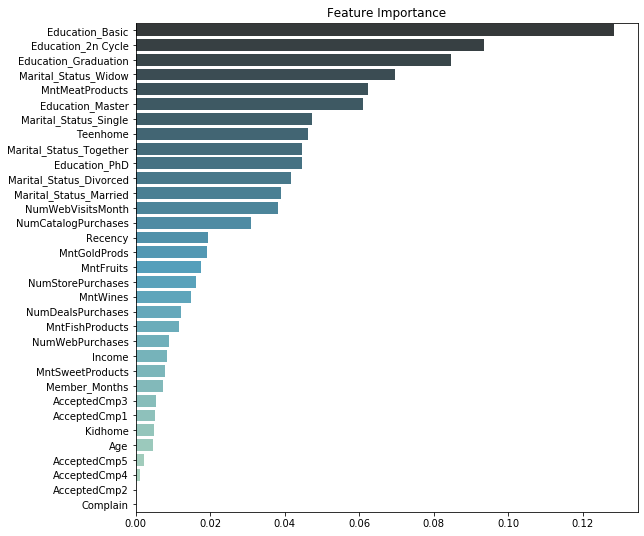

In [308]:
plt.figure(figsize=(9,9))
importances = pd.Series(data=classifier_xgb.feature_importances_, index=x_classif.columns)
importances = importances.sort_values(ascending=False)
sns.barplot(x=importances, y=importances.index, orient='h', palette='GnBu_d').set_title('Feature Importance')
plt.show()